This notebook serves as a detailed description of the physical model employed in my Ph.D. project, which aims to optimize precision agriculture procedures. The microclimate physical model presented here takes inspiration from Maclean's work in 2019 and is implemented using the Python programming language. This model aims to provide a comprehensive description of the local variations (at a 2-meter resolution) over a study area located in the Lombardian foothills (BG, Italy) in certain physical variables that influence temperature and humidity. It achieves this by utilizing global climate data and leveraging physical laws to establish connections between the local variations of these data and the terrain configuration of the study area. For the purpose of this research, the influence of vegetation is not considered. The global climate data used in the model are sourced from two distinct databases. The first is the ERA5 database, which generates climate data with a grid resolution of 25 km. The second database consists of data collected from an ARPA station located 1.3 km away from the study area. The model focuses on three primary physical variables: shortwave radiation, longwave radiation, and wind speed. These variables are combined with a feed-forward neural network, which is trained using data collected from sensors to predict temperature and humidity for each specific location within the study area (this step will be presented in a different notebook).

The notebook is structured into four main sections:
- The first section provides a description of the terrain properties within the study area.
- The second section offers an illustrative example that demonstrates the functionality of the physical model. This example utilizes data collected from both the ERA5 database and the ARPA station.
- The third section applies the physical model to derive the specific physical variables at the locations of the sensors.
- The fourth section saves the global climate data for future application.
- The last section shows the comparison between the climate data collected in the ERA5 database and the ones recorded by the ARPA station.

The following python packages are imported:

In [1]:
import numpy as np
import pandas as pd
import sys
import pickle
import matplotlib.pyplot as plt
import seaborn as sns
from datetime import datetime
import pygrib

import matplotlib as mpl
mpl.rcParams['axes.titlesize'] = 25
mpl.rcParams['axes.labelsize'] = 20
mpl.rcParams['legend.fontsize'] = 14
mpl.rcParams['xtick.labelsize'] = 18
mpl.rcParams['ytick.labelsize'] = 18
mpl.rcParams["font.family"] = "Times New Roman"

DATETIME = datetime.now().strftime("%d-%m-%Y_%H-%M-%S") 

USER_PATH = '/Users/marcozanchi/Work/Grade/'
DATA_PATH = USER_PATH + 'microclima/data/'
RESULTS_PATH = USER_PATH + 'microclima/notebooks/results/'
LIB_PATH = USER_PATH + 'microclima/lib/'

sys.path.append(LIB_PATH + 'plotting_methods')
from heatmpas_plotting_methods import make_heatmap
from sensors_plots import plot_sensors_data 

# Terrain properties of the study area

The study area is located in the Lombardian foothills in the province of Bergamo, Italy. 

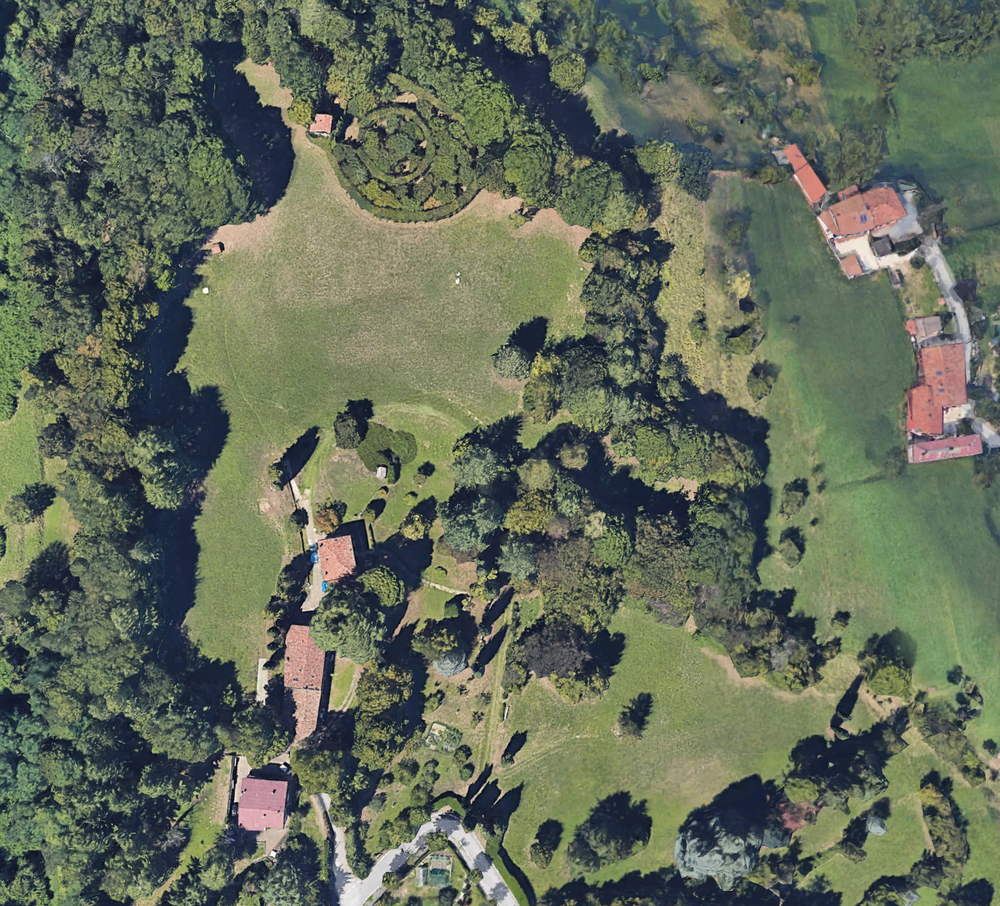

## Import and elaborate dsm

The terrain conformation is characterized by the digital surface model (DSM), which is a matrix representing the elevation of the surface at each point. To mitigate the impact of contour lines, the DSM has undergone a smoothing process using an average filter with a length of 8 meters.
The DSM employed in the present research covers a larger area beyond the study area. This broader coverage ensures that all the effects of nearby elevation profiles are encompassed within the study area when applying the physical model. The DSM is project on Gauss Boaga coordinates (so in the next heatmaps the y-axis coincides with the north Gauss Boaga direction and the x-axis with the east Gauss Boaga direction).

In [2]:
#load and display the total dsm
filename = DATA_PATH + 'data_torreboldone/dsm_TorreBoldone.p'    
infile = open(filename, 'rb')
dsm = pickle.load(infile)

resolution = 2

study_area_coordinates = [804,619,422,588]
box_a3_lat = study_area_coordinates[0]
box_a1_lat = study_area_coordinates[1]
box_a3_lon = study_area_coordinates[2]
box_a2_lon = study_area_coordinates[3]

#lat and long ov the center of the box
lat = 45.7247139
long = 9.6975472

dsm_study_case = dsm[box_a1_lat:box_a3_lat, box_a3_lon:box_a2_lon]

## Terrain properties

This section focuses on describing certain terrain attributes that will be utilized to model the influence of terrain conformation on the local variation of microclimate. The terrain itself is represented by a digital surface model (DSM), which is a matrix with spatial resolution providing elevation information for each point.
The attributes that are modeled include the slope and aspect of the terrain. These attributes indicate the displacement of each terrain point relative to a specific coordinate system. Additionally, the mean horizon angle and the sky view factor are considered, providing an indication of how much a point is surrounded by higher points in its vicinity.

In [4]:
sys.path.append(LIB_PATH + 'physical_model')
from terrain_utility import terrain, skyviewfactor
from utility import smooth

### Slope

The slope gradient $\beta$ reflects the maximal rate of change of elevation values and is defined in (Hengl, 2008) as :
\begin{equation*}
\beta = arctan(|\nabla \overline{Z}|)
\end{equation*}
where
\begin{equation*}
\nabla \overline{Z} = (\frac{\partial z}{\partial x},\frac{\partial z}{\partial y})
\end{equation*}
where z is the altitude.
Since the DSM is a discrete object a numerical algorithm has been applied to compute the partial derivatives over $x$ and $y$ as proposed by (Horn, 1981):
\begin{equation*}
\frac{\partial z}{\partial x} \approx \frac{(z_{0+}-z_{0-})}{2\Delta x} 
\end{equation*}

\begin{equation*}
\frac{\partial z}{\partial y} \approx \frac{(z_{+0}-z_{-0})}{2\Delta y} 
\end{equation*}


In [ ]:
# slope
slope = terrain(dsm_study_case, 'slope')

### Aspect

Aspect indicates the flow-line direction. When water (or any other flowing material) moves downhill under the influence of gravitational force, it will follow the direction specified by aspect (Hengl, 2008). Aspect can also be used to determine whether a cell should be considered sunny or not. For example, in the northern hemisphere, slopes facing south (i.e. with an aspect of $180^\circ$) receive more insolation than those facing north (i.e. with an aspect of $0^\circ$) (Hengl, 2008). Aspect it is measured in degrees, read clockwise from north, ranging from $0^\circ$ to 360°.
The aspect $\alpha$ can be computed as proposed by (Hengl, 2008):

\begin{equation*}
\alpha = -90^\circ[1-sign(q)][1-|sign(p)|]+180^\circ[1+sign(p)]-\frac{180^\circ}{\pi}sign(p)arccos(\frac{-q}{sqrt(q^2+p^2}))
\end{equation*}

where
\begin{equation*}
p = \frac{\partial z}{\partial x} 
\end{equation*}

\begin{equation*}
q = \frac{\partial z}{\partial y} 
\end{equation*}
have been computed as described in the slope section.

In [ ]:
#aspect
aspect = terrain(dsm_study_case, 'aspect')

### DSM smoothing

The DSM exhibits contour line effects, as demonstrated in the slope section. To alleviate the impact of these contour lines, a smoothing process has been applied to the DSM. An averaging filter with a size of 8 meters has been utilized for this purpose. Considering that the resolution of the DSM is 2 meters, each DSM cell is placed at the center of a square box consisting of 4 cells (referred to as a smoothing box). During the smoothing process, the elevation value of each DSM cell is replaced with the mean elevation value derived from the points within the smoothing box.

In [8]:
#smooth for future application
dsm = smooth(dsm,smooth_side = 2)
dsm_study_case = smooth(dsm_study_case,smooth_side = 2)

slope = terrain(dsm, 'slope')
aspect = terrain(dsm, 'aspect')

### Mean horizon angle and sky view factor

The horizon angle is defined as the maximum angle that obscures the horizon in a specific direction. Once the direction has been fixed with a certain angular sector, it is possible to compute the horizon angle for each point $k$ of the DSM as suggested in (Hengl, 2008):
\begin{equation*}
H_{angle}^k = max_{(i,j)}(arctan(\frac{A_{i,j}^k}{D_{i,j}^k}))
\end{equation*}
where $(i,j)$ are the coordinates of the DSM cells which ly in the a angular sectors, $A_{i,j}^k$ is the difference in the altitude between the $k$ the DSM cell and the cell defined by $(i,j)$ coordinates and $D_{i,j}^k$ is the distance of the $k$ DSM cell from the cell defined by $(i,j)$ coordinates.
The mean horizon angle is defined as the horizon angles averaged over all the possible directions (in practice the average has been taken over 36 angular sectors of $10^\circ$).

The sky view factor is a variable which describes the proportion of the sky available (for example the proportion of sky not covered by mountains, vegetation, buildings etc). This factor is computed for each cell $k$ of the DSM from the  mean horizon angle $\overline{H_{angle}^k}$, described in the previous paragraph, as:
\begin{equation*}
svf_k = \frac{1}{2} cos(2 \overline{H_{angle}^k}) + 0.5
\end{equation*}
This choice is reasonable since svf must be 0 when the mean horizon angle is $90^\circ$ and 1 when the mean horizon angle is $0^\circ$ (and increases monotonically from $0^\circ$ to $90^\circ$).

In [9]:
# mean horizon angle and sky view factor (takes around 2 min)
ha, svf = skyviewfactor(dsm, steps = 36, reso = 2)

ha_study_case = ha[box_a1_lat:box_a3_lat, box_a3_lon:box_a2_lon]
svf_study_case = svf[box_a1_lat:box_a3_lat, box_a3_lon:box_a2_lon]

# Physical model example

This section presents an illustrative example to demonstrate the functionality of the physical model at a specific time instance. Two examples are provided, utilizing data from the ERA5 database and the ARPA station.

The physical model requires the following inputs:
 - Time-related inputs: These include the local time hour, day, month, and year.
 - Space-related inputs: The longitude and latitude of the location of interest.
 - Terrain-related inputs: The digital surface model (DSM) with a specific resolution for the location of interest.
 - Climate-related inputs: Various climate-related parameters are required, such as direct solar radiation, diffuse solar radiation, specific humidity, pressure, fractional cloud cover, precipitation, reference temperature, wind speed, and wind direction.

Starting from these inputs, the physical model can effectively analyze and model the microclimate variations of the reference temperature, shortwave radiation, longwave radiation and wind speed based on the specific time and location of interest.

In [11]:
# The time instance is defined
year = 2023
month = 2
day = 2
hour = 13

## ERA5 database example

This section exemplifies the functionality of the physical model using the global climate data obtained from the ERA5 database. It begins by illustrating the process of loading the ERA5 climate data and further elaborating on them to generate inputs for the physical model. Subsequently, a detailed description is provided on how the physical model establishes connections between these global climate data and the terrain conformation, resulting in a comprehensive description of the reference temperature, shortwave radiation, longwave radiation and wind speed across the study area with a resolution of 2 meters. The final section shows the Microclimate class which wraps all the physical model operations.

### Load ERA5 climate data

The data from the ERA5 database can be downloaded from https://cds.climate.copernicus.eu/cdsapp#!/dataset/reanalysis-era5-single-levels?tab=form in a GRIB format (Hersbach, 2018).

The downloaded varibles are:
 - 10m v-component of wind: This parameter is the northward component of the 10m wind. It is the horizontal speed of air moving towards the north, at a height of ten metres above the surface of the Earth, in metres per second.
 - 10m u-component of wind: This parameter is the eastward component of the 10m wind. It is the horizontal speed of air moving towards the east, at a height of ten metres above the surface of the Earth, in metres per second. 
 - 2m dewpoint temperature: This parameter is the temperature to which the air, at 2 metres above the surface of the Earth, would have to be cooled for saturation to occur. It is measured in K.
 - 2m temperature: This parameter is the temperature of air at 2m above the surface of land, sea or inland waters. It is measured in K.
 - Surface pressure: This parameter is the pressure (force per unit area) of the atmosphere at the surface of land, sea and inland water. It is a measure of the weight of all the air in a column vertically above a point on the Earth's surface.  It is measured in Pa.
 - Total precipitation: This parameter is the accumulated liquid and frozen water, comprising rain and snow, that falls to the Earth's surface. It is measured in meters.
 - Total cloud cover: This parameter is the proportion of a grid box covered by cloud.
 - Surface solar radiation downwards: This parameter is the amount of solar radiation (also known as shortwave radiation) that reaches a horizontal plane at the surface of the Earth. This parameter comprises both direct and diffuse solar radiation. The units are joules per square metre (J m-2 ).
 - Total sky direct solar radiation at surface: This parameter is the amount of direct solar radiation (also known as shortwave radiation) reaching the surface of the Earth. It is the amount of radiation passing through a horizontal plane. he units are joules per square metre (J m-2 ).

The data have been downloaded for the following sub region: 
 - North: 46
 - Sud: 44
 - West: 8
 - Ovest: 10

Since the ERA5 database resolution is about 0.25 degrees and the study area is located at latitude of 45.7247139 decimal degrees and longitude of 9.6975472 decimal degrees the global climate data corresponds to the (7,7) element of the ERA5 sub region matrix.

In [12]:
sys.path.append(LIB_PATH + 'input_data_elaboration')
from data_era5_elaboration import load_data_era5, elaborate_data_era5


In [13]:
#this method loads in a pd.DataFrame the raw ERA5 data stored in a grib_filename for a specific period
df_Feb_raw = load_data_era5(grib_filename = DATA_PATH+'/data_era5/DataERA5_{}_{:02d}.grib'.format(year,month), 
                            year = year, month = month, days_range=(day,day+1)) 

df_Feb_raw[:5]

,day,hour,month,year,10 metre U wind component,10 metre V wind component,2 metre dewpoint temperature,2 metre temperature,Total sky direct solar radiation at surface,Surface solar radiation downwards,Total precipitation,Total cloud cover,Surface pressure
0,2,0,2,2023,0.766647,1.125931,274.618164,278.783936,0.0,0.0,4.768372e-07,0.929108,97194.9375
1,2,1,2,2023,1.274796,0.918137,274.575684,278.604980,0.0,0.0,3.814697e-06,0.757874,97174.8750
2,2,2,2,2023,0.902542,1.217453,274.196045,276.561523,0.0,0.0,1.239777e-05,0.617493,97157.7500
3,2,3,2,2023,0.886597,1.275253,274.104736,275.686523,0.0,0.0,1.478195e-05,0.713104,97116.4375
4,2,4,2,2023,1.060898,1.138885,274.505859,275.835938,0.0,0.0,4.291534e-06,0.789612,97133.9375


### ERA5 climate data elaboration 

Before using climate data extracted from the ERA5 databases as inputs for the physical model, certain elaborations are required. The following list defines all the input climate data for the model and explains their relationship with the raw ERA5 variables:

1) Direct solar radiation arrives from the direction of the solar disk and includes a small component scattered forward (Monteith, 2013). It is computed as the total sky direct solar radiation at surface (it is measured in $[\frac{MJ}{m^2 hour}]$). The total sky direct solar radiation at surface has been obtained from (Hersbach, 2018) from *Total sky direct solar radiation at surface* variable.

2) Diffuse radiation describes all other scattered radiation received from the blue sky and from clouds, either by reflection or transmission (Monteith, 2013). It is computed as the surface solar radiation downwards (the amount of solar radiation that reaches a horizontal plane at the surface of the Earth) minus the direct solar radiation computed as described above (it is measured in $[\frac{MJ}{m^2 hour}]$). The surface solar radiation downwards has been obtained from (Hersbach, 2018) from *Surface solar radiation downwards* variable.

3) Pressure is pressure (force per unit area) of the atmosphere at the surface of land (measured in Pa). The pressure has been obtained from (Hersbach, 2018) from *Surface pressure* variable.

4) Fractional cloud cover is the proportion of a grid box covered by cloud. Total cloud cover is a single level field calculated from the cloud occurring at different model levels through the atmosphere (cloud fractions vary from 0 to 1). The cloud cover has been obtained from (Hersbach, 2018) from *Total cloud cover* variable.

5) Reference temperature is the temperature at 2 meters high obtained from (Hersbach, 2018) from *2m temperature* variable. Since we are interested in the description of microclimate at 1 meter above the surface we have modified the reference temperature according the lapse rate of $6.50 ^{\circ}C/km$ defined by the international standard atmosphere model (ISA):
\begin{equation*}
T_{1m}=T_{2m}+6.50^{\circ}C/1000
\end{equation*}


6) Wind speed ($W_{speed}$), measured in $\frac{m}{s}$, is computed from the u,v component of the wind at 10 meters ($W_U$, $W_V$) high as: 
\begin{equation*}
W_{speed} =  \sqrt{W_U^2 + W_V^2}
\end{equation*}
The u component  is the eastward component of the wind, at a height of 10 metres above the surface of the Earth. 
The v component  is the northward component of the wind, at a height of 10 metres above the surface of the Earth. U,V component of the wind have been obtained from (Hersbach, 2018) from *10 metre U,V wind component* variable. Since we are interested in the microclimate at 1 meter above the surface, we have rescaled the wind speed according the altitude following a logarithmic profile model (Monteith, 2013):
\begin{equation*}
 u_{1m} = u_{10m} \frac{log\frac{h_{1m}}{0.023}}{log\frac{h_{10m}}{0.023}}
\end{equation*}
where $h_{1m} = 1$  and $h_{10m} = 10$ and 0.023 is the surface roughness for grass 0.1 meter high (Monteith, 2013).\\

7) Wind direction is computed from the u,v component of the wind at 10 meters high as: 
\begin{equation*}
W_{direction} =  (\arctan{(\frac{W_U}{W_V}) } \frac{180^{\circ}}{\pi} + 180^{\circ})\% 360^{\circ} 
\end{equation*}
The wind direction describes the direction from which the wind comes from with the North direction as reference in decimal degrees $^{\circ}$ (wind direction from North is equal to $0^{\circ}$, from East is equal to $90^{\circ}$ etc). This convention is taken into account in the above equation: the inverse of the tangent of the ratio between the u,v component of the wind describes the direction in which the wind blows. In order to change the direction (from blowing direction to the direction from which the wind comes from), we have inverted the reference system of the u,v components (the mathematical operation id defined by adding $180^{\circ}$ to the angle computed from the inverse of the tangent of the u,v components ratio).

8) Specific humidity is the mass of water vapor per unit mass of moist air (Monteith, 2013). It is dimensionless and it can be computed as:
\begin{equation*}
\begin{split}
h_s & = \frac{m_{water}} {m_{air total}}  = \frac{m_{water}} {m_{air dry} + m_{water}} = \frac{\rho_{water}} {\rho_{air dry} + \rho_{water}}
\end{split}
\end{equation*}
Exploiting the state equation of perfect gas:
\begin{equation*}
\begin{split}
\rho_{water}R_{water}T = e
\end{split}
\end{equation*}
where $R_{water}$ is the gas constant of water, $T$ the temperature and $e$ is the actual vapour pressure. The same equation can be written for $\rho_{air dry}$, opportunely modified with pressure $p-e$, where p is the surface atmospheric pressure in Pa. Substituting in the equation for $h_s$:
\begin{equation*}
\begin{split}
h_s & = \frac{\frac{e}{R_{water}T}}{\frac{p-e}{R_{air dry}T}+\frac{e}{R_{water}T}} = \frac{e\frac{R_{water}}{R_{air dry}}}{p-(1-\frac{R_{water}}{R_{air dry}})e}=\\
    & = \frac{0.622 e}{p-0.378 e}
\end{split}
\end{equation*}
The actual vapour pressure in Pa can be computed from (Bolton, 1980) as:
\begin{equation*}
e =  610.8 exp^{ \frac{17.27 T_D}{T_D + 237.3}}
\end{equation*}
where $T_D$ is the dew point temperature (the temperature the air needs to be cooled to, at constant pressure, in order to achieve saturation). The dew point temperature has been obtained from the ERA5 database (Hersbach, 2018) from *2m dewpoint temperature* variable.  Since we are interested in the description of microclimate at 1 meter above the surface we have modified the dewpoint temperature according the lapse rate of $6.50 ^{\circ}C/km$ defined by the international standard atmosphere model (ISA):
\begin{equation*}
Tdew_{1m}=Tdew_{2m}+6.50^{\circ}C/1000
\end{equation*}

9) Relative humidity the ratio of air actual vapor pressure to the saturation vapor pressure at the same temperature (Monteith, 2013):
\begin{equation*}
h_r(T) = \frac{e}{e_s(T)}
\end{equation*}
where $e$ is the actual vapor pressure and $e_s(T)$ is the saturation vapor pressure at temperature $T$, which can be computed, in Pa, from (Bolton, 1980) as:
\begin{equation*}
e_s =  610.8 exp^{ \frac{17.27 T}{T + 237.3}}
\end{equation*}
The temperature $T$ has been obtained from (Hersbach, 2018) from *2m temperature* variable (it is the reference temperature described below).


In [14]:
sys.path.append(LIB_PATH + 'input_data_elaboration')
from data_era5_elaboration import elaborate_data_era5

In [15]:
#this method loads the ERA5 raw data and elaborates them returning a pd.DataFrame which is sliced for the period of interest

df_Feb = elaborate_data_era5(grib_filename = DATA_PATH+'/data_era5/DataERA5_{}_{:02d}.grib'.format(year,month), 
                             year = year, month = month, days_range=(day,day+1)) 
df = df_Feb[(df_Feb.Hour == hour) & (df_Feb.Day == day) & (df_Feb.Month == month) & (df_Feb.Year == year)]
df

,Day,Hour,Month,Year,Temperature 1m,Dew Temperature 1m,Specific humidity,Relative humidity,Pressure,Cloud cover,Wind speed 1m,Wind direction,Direct shortwave radiation,Diffuse shortwave radiation,Precipitation
13,2.0,13.0,2.0,2023.0,8.992242,3.719293,0.005122,69.486805,97121.625,1.0,1.364654,246.751628,0.725056,0.49216,4.768372e-07


### Lapserate temperature

The lapserate is the rate at which an atmospheric variable, normally temperature in Earth's atmosphere, falls with altitude. The moist adiabatic lapse rate $\Gamma_m$ can be defined as:

\begin{equation*}
\Gamma_m = g (1+\frac{L_vr_v}{QT}) (c_{pd}+\frac{0.622L_v^2r_v}{QT^2})^{-1}
\end{equation*}

where  $g$ is gravitational acceleration (9.8076 m/s), $L_v$ is the latent heat of vaporisation (2501000 J/kg), $Q$ is the gas constant for dry air (287 J $kg^{-1}$$K^{-1}$), $c_{pd}$ is the specific heat of dry air at constant pressure (1003.5 J $kg^{-1}$$K^{-1}$), $T$ is the reference temperature and $r_v$ is the mixing ratio of water vapour given by:
\begin{equation*}
r_v = \frac{0.622 e}{P-e} 
\end{equation*}
where $e$ is the actual vapor pressure and $P$ is the surface pressure.

The final correction for the lapserate is computed for each point of the DSM as:
\begin{equation*}
T = T_{ref}-\Gamma_m (DSM-A_{ref})
\end{equation*}

where $T_{ref}$ is the reference temperature and $A_{ref}$ is the reference altitude (the altitude at which the reference temperature has been computed). In the present case $T_{ref}$ has not a defined reference altitude, so  $A_{ref}$ has been set as the average altitude of the DSM of the study area.

In [16]:
sys.path.append(LIB_PATH + 'physical_model')
from utility import compute_specific_humidity,lapserate
from solar_utility import julday

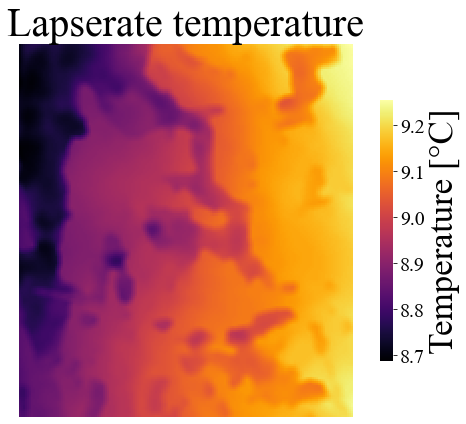

In [17]:
t = df['Temperature 1m'].values[0]
p = df['Pressure'].values[0]
tdew =  df['Dew Temperature 1m'].values[0]
hs = compute_specific_humidity(tdew, t, p)

lapserate_correction = lapserate(t, hs, p)*(dsm-np.mean(dsm_study_case))
tc = t + lapserate_correction
tc_study_area = tc[box_a1_lat:box_a3_lat, box_a3_lon:box_a2_lon]

fig,ax = make_heatmap(tc_study_area, cmap = 'inferno', vmin = np.min(tc_study_area), vmax = np.max(tc_study_area),
                      cbar_label = 'Temperature [°C]', title = 'Lapserate temperature', figsize=(8,6)
                     )

### Shortwave radiation

Shortwave radiation is the solar radiation received at the ground(Monteith, 2013). It is defined as the sum between the direct and the diffuse  solar radiation:

\begin{equation*} 
R_{sw} = (R_{dir} + R_{dif}) (1-a)
\end{equation*}
where the factor $a$ is the albedo and describes the amount of reflected radiation. The albedo is set to 0.25 as pointed by (Monteith, 2013).

The  direct solar radiation arrives from the direction of the solar disk and includes a small component scattered forward (Monteith, 2013). 
Its amount on a horizontal surface is obtained from the ERA5 database (Hersbach, 2018) as the total sky direct solar radiation at surface (it is measured in $[\frac{MJ}{m^2 hour}]$). Since the terrain conformation is not flat, the radiation has been rescaled as the amount of direct radiation received by an inclined surface, with the slope and aspect of the local terrain. The flux of radiation that reaches an inclined surface can be computed following(Hengl, 2008) as:
\begin{equation*}
R_{dir} =  \frac{S_{Dir}}{cos(\theta)}\zeta [cos(\theta)cos(\beta) + sin(\theta)sin(\beta)cos(\phi-\alpha)]
\end{equation*}
where $S_{Dir}$ is the the total sky direct solar radiation at surface obtained from the ERA5 database, $\zeta$ is defined as a binary mask which indicates if the surface is shaded or not, $\theta$ is the sun zenith, $\phi$ is the sun azimuth, $\beta$ is the surface slope and  $\alpha$ is the surface aspect.
The above equation can be explained by the following: the flux of radiation that reaches an inclined surface is the amount of radiation that pass though the same surface but oriented normally to the beam direction rescaled by the cosine of the angle between the two surface. The term $\frac{S_{Dir}}{cos(\theta)}$ describes the amount of radiation that passes through a surface orthogonal to the beam ($S_{Dir}$ it is the radiation trough an horizontal surface when the sun has a zenith angle $\theta$). In order to compute the amount of solar radiation reaching a generic surface defined by a slope and an aspect, the amount of radiation that passes through a surface orthogonal to the beam needs to be multiplied by the cosine of the angle between this surface and the generic surface defined as $\cos(\gamma)$. The $\cos(\gamma)$ can be computed by the scalar product on spherical coordinates of the normal surface vectors of between the two surfaces (we suppose to work with unit areas for simplicity):

\begin{equation*}
 \underline{n}_{sun} = (sin(\theta)cos(\phi), sin(\theta)sin(\phi),cos(\theta))
\end{equation*}

where $\underline{n}_{sun}$ is the normal surface vector for the surface orthogonal to the radiation direction, $\theta$ is the sun zenith and  $\phi$ is the sun azimuth

\begin{equation*}
 \underline{n}_{incl} = (sin(\beta)cos(\alpha), sin(\beta)sin(\alpha),cos(\beta))
\end{equation*}

where $\underline{n}_{incl}$ is the normal surface vector for the inclined surface, $\beta$ is the surface slope and  $\alpha$ is the surface aspect.

So the scalar product can be computed as:
\begin{equation*}
\begin{split}
cos(\gamma) &= \underline{n}_{sun} * \underline{n}_{incl} = \\
&= sin(\theta)cos(\phi)sin(\beta)cos(\alpha)+ sin(\theta)sin(\phi)sin(\beta)sin(\alpha)+cos(\theta)cos(\beta)= \\
&= cos(\theta)cos(\beta)+sin(\theta)sin(\beta)(cos(\phi)cos(\alpha)+sin(\phi)sin(\alpha))=\\
&= cos(\theta)cos(\beta) + sin(\theta)sin(\beta)cos(\phi-\alpha)
\end{split}
\end{equation*}

The shadow mask $\zeta$ is computed for each digital surface model point as:
\begin{equation*}
\zeta = \begin{cases}
1 &\text{if $\omega < 90^{\circ}-\theta$} \\
0 &\text{if $\omega > 90^{\circ}-\theta$} 
\end{cases}
\end{equation*}

where $\omega $ is the horizon angle of the DSM point in the solar azimuth direction.


The diffuse radiation describes all scattered radiation received from the blue sky and from clouds, either by reflection or transmission (Monteith, 2013). The diffuse radiation on a horizontal surface is computed as the surface solar radiation downwards (the amount of solar radiation that reaches a horizontal plane at the surface of the Earth) minus the direct solar radiation computed as described above (it is measured in $[\frac{MJ}{m^2 hour}]$), obtained from (Hersbach, 2018) . The diffuse radiation on an inclined surface can be computed as proposed by (Hay, 1985) dividing it in an isotropic component $R_{I}$, an anisotropic component $R_{A}$ and a component reflected by the surroundings $R_{R}$:

\begin{equation*}
 R_{dif} = R_{I}+R_{A}+R_{R}
\end{equation*}
$R_{I}$ can be computed as:
\begin{equation*}
 R_{I} = \frac{1}{2}D(1+cos(\alpha))(1-k)svf
\end{equation*}
where $D$ is the diffuse radiation on an horizontal surface obtained from (Hersbach, 2018), $\alpha$ is the slope of the surface and $k$ is the anisotropic index defined as $k = \frac{S_{dir}}{cos(\theta) R_0}$, where $R_0 = 4.87 \frac{MJ}{m^2 h}$. The term $\frac{1}{2}(1+cos(\alpha))$ defines how much horizon the surface can access (if the slope is $0^\circ$ this therm is equal to 1, if the slope is $90^\circ$ the available portion of horizon is the half of the total horizon). The $svf$ term shows how much horizon is available (not covered by obstacles).

$R_{A}$ can be computed as:
\begin{equation*}
 R_{A} = \frac{R_{dir}D}{R_0}
\end{equation*}
where $R_{dir}$ is the direct shortwave radiation computed in the section above. It describes the circumsolar radiation.

$R_{R}$ can be computed as:
\begin{equation*}
 R_{R} = \frac{1}{2}Da_r(1 - cos(\alpha + h_a))
\end{equation*}
where $a_r$ is the mean albedo of the surroundings (it is set to 0.25 as pointed by (Monteith, 2013) and $h_a$ is the mean horizon angle. The idea behind this equation is to approximate the reflected radiation from the surroundings as the radiation reflected by an infinite surface with slope equal to the average slope of the surroundings (this can be identified by the mean horizon angle).

In [18]:
sys.path.append(LIB_PATH + 'physical_model')
from solar_utility import julday
from radiation_utility import shortwave_radiation

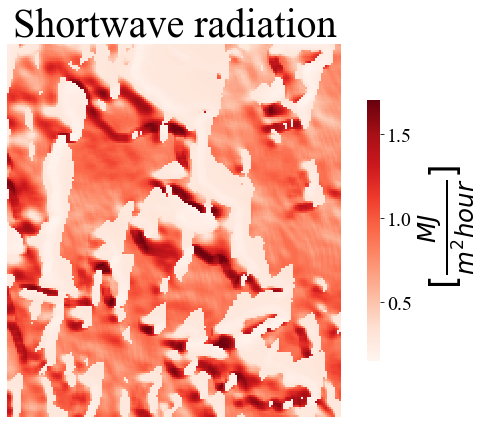

In [19]:
dir_rad =df['Direct shortwave radiation'].values[0]
dif_rad = df['Diffuse shortwave radiation'].values[0]

julian = julday(year=year, month=month, day=day, hour=0)

swr = shortwave_radiation(dir = dir_rad, dif = dif_rad,
                          julian = julian, localtime = hour, 
                          dsm = dsm, slope = slope, aspect = aspect,
                          lat = lat, long = long,
                          reso = resolution, ha = ha, svf = svf, 
                          alb = 0.25, albr = 0.25,
                          )

swr_study_area = swr[box_a1_lat:box_a3_lat, box_a3_lon:box_a2_lon]
fig,ax = make_heatmap(swr_study_area, cmap = 'Reds', vmin = np.min(swr_study_area), vmax = np.max(swr_study_area),
                      cbar_label = r' $[\frac{MJ}{m^2 hour}]$', title = 'Shortwave radiation', figsize=(8,6)
                     )

### Longwave radiation

Longwave radiation is the radiation exchanged between the ground and the atmosphere (Monteith, 2013). It can be described treating surfaces as full radiators. A surface with temperature $T_s$ emits radiation as described by:
\begin{equation*}
 R_{lwEmitted} = \sigma T_s^4
\end{equation*}

however it also received some longwave radiation from the atmosphere as:
\begin{equation*}
 R_{lwReceived} = \epsilon_m\sigma T_{air}^4 svf
\end{equation*}
where $\epsilon_m$ is the emissivity, $\sigma$ is the Boltzmann constant ($\sigma = 5.6693 10^{-8}Wm^{-2}K^{-4}$) and svf is the sky view factor (it takes into account the portion of available sky; it has been described in previous sections).
The total longwave radiation $R_{lw}$ is treated as outcoming (if summed to the shortwave radiation it will need a minus in front of it):
\begin{equation*}
 R_{lw} = R_{lwEmitted}-R_{lwReceived} = (1-\epsilon_m svf)\sigma T^4
\end{equation*}
assuming small differences between the air and surface temperature (note that the temperature used to compute the $R_{lw}$ is the reference temperature corrected by the lapserate).
The emissivity can be computed from (Konzelmann, 1994) as:

\begin{equation*}
 \epsilon_m = \epsilon_{cs}F(n)
\end{equation*}
where $\epsilon_{cs}$ is the is full-spectrum, clear-sky emittance and $F(n)$ is the "cloud factor"  describing the increase in radiation due to clouds. 

$\epsilon_{cs}$ can be defined from(Hengl, 2008) as:
\begin{equation*}
 \epsilon_{cs} = 1.24(\frac{e}{T})^{\frac{1}{7}}
\end{equation*}
where e is the water vapor pressure and $1.24$ reflects a parameter relationship between vapor pressure and temperature near the ground (Brutsaert, 1975).
While $F(n)$ is defined in (Konzelmann, 1994) as a weighted sum factor to weight the contribution of the cloud fraction:
\begin{equation*}
 F_n = (1-n)+\frac{\epsilon_{oc}}{\epsilon_{cs}}n
\end{equation*}
where $\epsilon_{oc}$ is the emittance for a totally overcast sky (here set to 1). Combining all the factors mentioned above it is possible to obtain:
\begin{equation*}
 R_{lwReceived} = ((1-n)\epsilon_{cs}+\epsilon_{oc}n)\sigma T^4
\end{equation*}
which describes the radiation emmitted from the atmosphere and received by the surface as a term related to clear sky conditions (the first) and a term which describes an overcast sky(the second).

In [20]:
sys.path.append(LIB_PATH + 'physical_model')
from solar_utility import julday
from radiation_utility import longwave_radiation

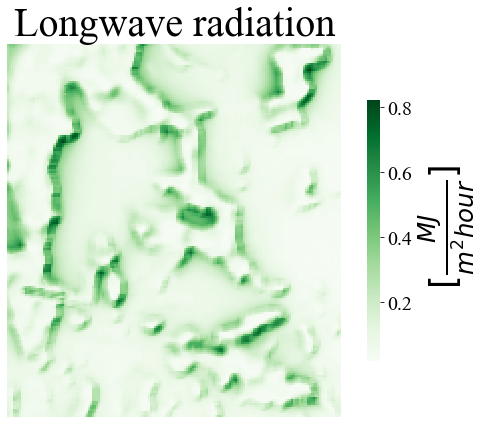

In [21]:
t = df['Temperature 1m'].values[0]
p = df['Pressure'].values[0]
tdew =  df['Dew Temperature 1m'].values[0]
hs = compute_specific_humidity(tdew, t, p)
n = df['Cloud cover'].values[0]

lapserate_correction = lapserate(t, hs, p)*(dsm-np.mean(dsm_study_case))
tc = t + lapserate_correction

lwr = longwave_radiation(hs, tc, n, p, svf, dsm_shape = dsm.shape)
lwr_study_area = lwr[box_a1_lat:box_a3_lat, box_a3_lon:box_a2_lon]
fig,ax = make_heatmap(lwr_study_area, cmap = 'Greens', vmin = np.min(lwr_study_area), vmax = np.max(lwr_study_area),
                      cbar_label = r' $[\frac{MJ}{m^2 hour}]$', title = 'Longwave radiation', figsize=(8,6)
                     )

### Wind

The terrain conformation influences the wind speed $u_{1m}$ according to a topographic shelter coefficient $w_s$:
\begin{equation*}
 wind =  u_{1m}w_s
\end{equation*}

The idea is to compute the horizon angle in the wind direction (the point in the DSM where the horizon angle is maximum must be higher than 1 meter, if not the $w_s$ is zero, the wind is not stopped by the topography). Then $w_s$ is defined as suggested in (Ryan, 1977):
\begin{equation*}
 w_s =  1- \frac{arctan(0.17tan(Horizon_{angle})100)}{\frac{\pi}{2}}
\end{equation*}
The idea is that if the horizon angle is higher the location will be more protected from the wind ($w_s$ will become less than 1 and so decreases the wind speed at 1 m $u_{1m}$. The division by ${\frac{\pi}{2}}$ it is needed to transform the value of the arctan from [0,${\frac{\pi}{2}}$] to [0,1].

In [22]:
sys.path.append(LIB_PATH + 'physical_model')
from wind_utility import windcoef

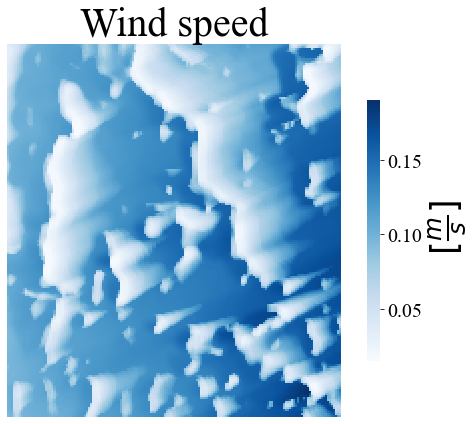

In [23]:
wind_direction = df['Wind direction'].values[0]
wind_speed = df['Wind speed 1m'].values[0]

ws = windcoef(dsm, wind_direction, reso = 2, hgt = 1)
wind = ws*wind_speed 

wind_study_area = wind[box_a1_lat:box_a3_lat, box_a3_lon:box_a2_lon]
fig,ax = make_heatmap(wind_study_area, cmap = 'Blues', vmin = np.min(wind_study_area), vmax = np.max(wind_study_area),
                      cbar_label = r' $[\frac{m}{s}]$', title = 'Wind speed', figsize=(8,6)
                     )

### Microclimate class

This section introduces the Microclimate class, which serves as a container for methods designed to calculate the local variation of microclimate. The class takes as the digital surface model (DSM) along with its terrain properties and the uniform climate data. By utilizing these inputs, the Microclimate class computes the shortwave radiation, lapserate temperature correction, longwave radiation, and sheltered wind speed for each point within the area of interest. These computed parameters are stored as attributes of the Microclimate class and plotted below.

In [24]:
sys.path.append(LIB_PATH + 'physical_model')
from microclimate import Microclimate

In [25]:
#define climate data
dir =df['Direct shortwave radiation'].values[0]
dif = df['Diffuse shortwave radiation'].values[0]

t_ref = df['Temperature 1m'].values[0]
p = df['Pressure'].values[0]
tdew =  df['Dew Temperature 1m'].values[0]
hs = compute_specific_humidity(tdew, t, p)
n = df['Cloud cover'].values[0]
wind_direction = df['Wind direction'].values[0]
wind_speed = df['Wind speed 1m'].values[0]

alb = 0.25
albr = 0.25

#the DSM related variables have been defined in the first section of the present notebook!
#the time instance has been defined at the start of the 'physicak model example' section

In [26]:
microclima = Microclimate(year = year, month = month, day = day, localtime = hour,
                     lat = lat, long = long,
                     dsm = dsm, slope = slope, aspect = aspect, ha = ha, svf = svf,
                     resolution = resolution, study_area_coordinates = study_area_coordinates,
                     dir = dir, dif = dif, hs = hs, p = p, n = n, t_ref = t_ref,
                     wind_speed = wind_speed, wind_direction = wind_direction,
                     alb = alb, albr = albr)

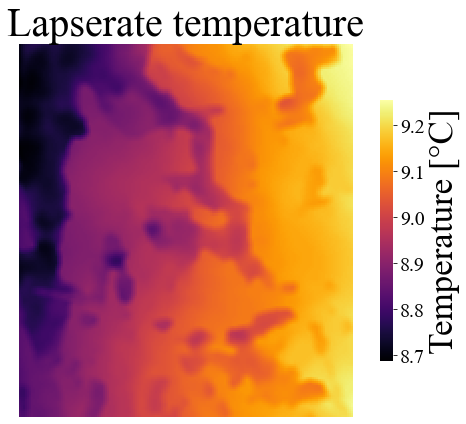

In [27]:
tc_ref = microclima.Tref

tc_ref_study_area = tc_ref[box_a1_lat:box_a3_lat, box_a3_lon:box_a2_lon]

fig,ax = make_heatmap(tc_ref_study_area, cmap = 'inferno', vmin = np.min(tc_ref_study_area), vmax = np.max(tc_ref_study_area),
                      cbar_label = 'Temperature [°C]', title = 'Lapserate temperature', figsize=(8,6),
                      save_figure=True,
                      figure_filename=RESULTS_PATH+'figures/microclimate_examples_figures/ERA5_lapserate_{}_{}_{}_{}.png'.format(year, month, day, hour)
                     )

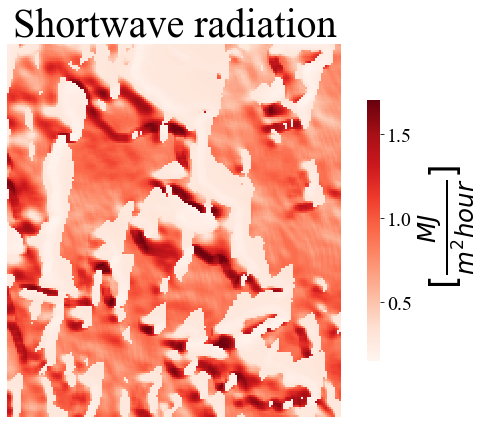

In [28]:
swr = microclima.ShortWaveRad

swr_study_area = swr[box_a1_lat:box_a3_lat, box_a3_lon:box_a2_lon]
fig,ax = make_heatmap(swr_study_area, cmap = 'Reds', vmin = np.min(swr_study_area), vmax = np.max(swr_study_area),
                      cbar_label = r' $[\frac{MJ}{m^2 hour}]$', title = 'Shortwave radiation', figsize=(8,6),
                      save_figure=True,
                      figure_filename=RESULTS_PATH+'figures/microclimate_examples_figures/ERA5_swrad_{}_{}_{}_{}.png'.format(year, month, day, hour)
                     )

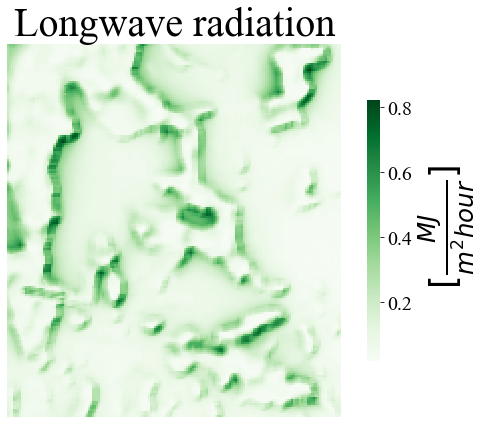

In [29]:

lwr = microclima.LongWaveRad

lwr_study_area = lwr[box_a1_lat:box_a3_lat, box_a3_lon:box_a2_lon]
fig,ax = make_heatmap(lwr_study_area, cmap = 'Greens', vmin = np.min(lwr_study_area), vmax = np.max(lwr_study_area),
                      cbar_label = r' $[\frac{MJ}{m^2 hour}]$', title = 'Longwave radiation', figsize=(8,6),
                      save_figure=True,
                      figure_filename=RESULTS_PATH+'figures/microclimate_examples_figures/ERA5_lwrad_{}_{}_{}_{}.png'.format(year, month, day, hour)
                     )

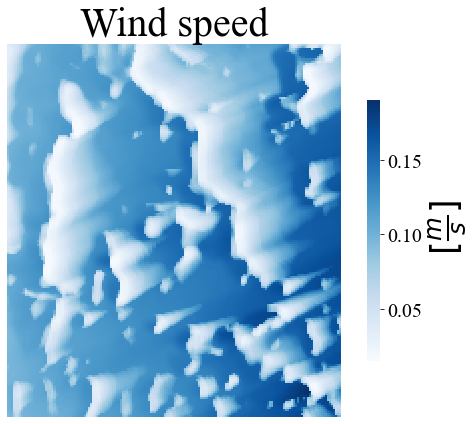

In [30]:

wind = microclima.Wind

wind_study_area = wind[box_a1_lat:box_a3_lat, box_a3_lon:box_a2_lon]
fig,ax = make_heatmap(wind_study_area, cmap = 'Blues', vmin = np.min(wind_study_area), vmax = np.max(wind_study_area),
                      cbar_label = r' $[\frac{m}{s}]$', title = 'Wind speed', figsize=(8,6),
                      save_figure=True,
                      figure_filename=RESULTS_PATH+'figures/microclimate_examples_figures/ERA5_wind_{}_{}_{}_{}.png'.format(year, month, day, hour)
                     )

## ARPA station + ERA5 database  example

This section demonstrates the operational functionality of the physical model by utilizing global climate data obtained from an ARPA station located 1.3 km away from the study area. As the ARPA station does not measure all the required climate variables for the physical model, the dataset from the ARPA station has been merged with the ERA5 database.

Specifically, the ERA5 database provides the radiation parameters, cloud cover, and surface pressure, which are assumed to have minimal variation over the ERA5 grid resolution. On the other hand, the ARPA station measures variables such as temperature, relative humidity, precipitation, wind speed, and wind direction.

The section commences by explaining the methodology to load, process, and merge the data collected from the ARPA station with the ERA5 data. The subsequent section introduces the Microclimate class, which encapsulates all the operations of the physical model. For a more comprehensive understanding of the physical model, please refer to the previous section titled 'ERA5 database example.'

### Load and elaborate climate data from ERA5 and ARPA station

The data measured by the ARPA station can be downloaded at https://www.arpalombardia.it/temi-ambientali/meteo-e-clima/form-richiesta-dati/ .

The downloaded variables are the temperature, the relative humidity, the precipitation, the wind speed and the wind direction.

The ARPA station considered is locted in Via Goisis, Bergamo, Italy at 290 meters of altitude (45.69568034432694°, 9.66124914606551°). The information about this ARPA station can be founded at https://www.dati.lombardia.it/widgets/nf78-nj6b

At the moment the recordings heights are unkown so it is hypothesize a value of 1 meter height.

In [31]:
sys.path.append(LIB_PATH + 'input_data_elaboration')

from data_arpa_elaboration import elaborate_data_mixed_arpa_era5

In [32]:
#this method loads in a pd.DataFrame the elaborated ERA5 data and the ARPA station data merging them in a pd.DataFrame

df_mixed_arpa_era5 = elaborate_data_mixed_arpa_era5(era5_grib_filename = DATA_PATH+'/data_era5/DataERA5_{}_{:02d}.grib'.format(year,month), 
                                                    arpa_foldername = DATA_PATH+'data_arpa/data_arpa_goisis/data_arpa_goisis_{}_{:02d}/data_arpa_goisis_{}_{:02d}_'.format(year,month,year,month),
                                                    dsm_study_case = dsm_study_case, arpa_station_altitude = 290,
                                                    year = year, month = month, days_range=(day,day+1)) 

df = df_mixed_arpa_era5[df_mixed_arpa_era5.Hour == hour]
df

,Day,Hour,Month,Year,Temperature 1m,Dew Temperature 1m,Specific humidity,Relative humidity,Pressure,Cloud cover,Wind speed 1m,Wind direction,Direct shortwave radiation,Diffuse shortwave radiation,Precipitation
13,2.0,13.0,2.0,2023.0,16.393314,3.719293,0.003434,28.7,97121.625,1.0,2.2,263.0,0.725056,0.49216,0.0


### Microclimate class

This section introduces the Microclimate class, which serves as a container for methods designed to calculate the local variation of microclimate. The class takes as the digital surface model (DSM) along with its terrain properties and the uniform climate data. By utilizing these inputs, the Microclimate class computes the shortwave radiation, lapserate temperature correction, longwave radiation, and sheltered wind speed for each point within the area of interest. These computed parameters are stored as attributes of the Microclimate class and plotted below.

In [33]:
sys.path.append(LIB_PATH + 'physical_model')
from microclimate import Microclimate

In [34]:
dir =df['Direct shortwave radiation'].values[0]
dif = df['Diffuse shortwave radiation'].values[0]

t_ref = df['Temperature 1m'].values[0]
p = df['Pressure'].values[0]
hs = df['Specific humidity'].values[0]
n = df['Cloud cover'].values[0]
wind_direction = df['Wind direction'].values[0]
wind_speed = df['Wind speed 1m'].values[0]

alb = 0.25
albr = 0.25

In [35]:
microclima = Microclimate(year = year, month = month, day = day, localtime = hour,
                     lat = lat, long = long,
                     dsm = dsm, slope = slope, aspect = aspect, ha = ha, svf = svf,
                     resolution = resolution, study_area_coordinates = study_area_coordinates,
                     dir = dir, dif = dif, hs = hs, p = p, n = n, t_ref = t_ref,
                     wind_speed = wind_speed, wind_direction = wind_direction,
                     alb = alb, albr = albr)

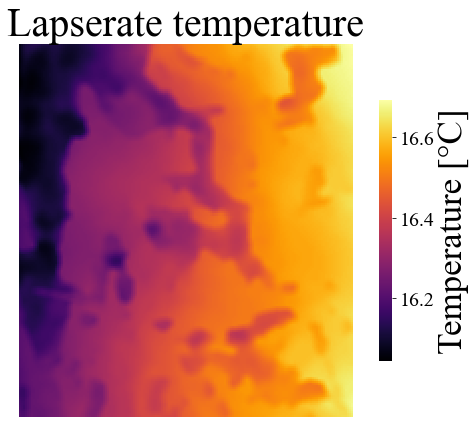

In [36]:
tc_ref = microclima.Tref

tc_ref_study_area = tc_ref[box_a1_lat:box_a3_lat, box_a3_lon:box_a2_lon]

fig,ax = make_heatmap(tc_ref_study_area, cmap = 'inferno', vmin = np.min(tc_ref_study_area), vmax = np.max(tc_ref_study_area),
                      cbar_label = 'Temperature [°C]', title = 'Lapserate temperature', figsize=(8,6),
                      save_figure=True,
                      figure_filename=RESULTS_PATH+'figures/microclimate_examples_figures/mixed_arpa_ERA5_lapserate_{}_{}_{}_{}.png'.format(year, month, day, hour)
                     )

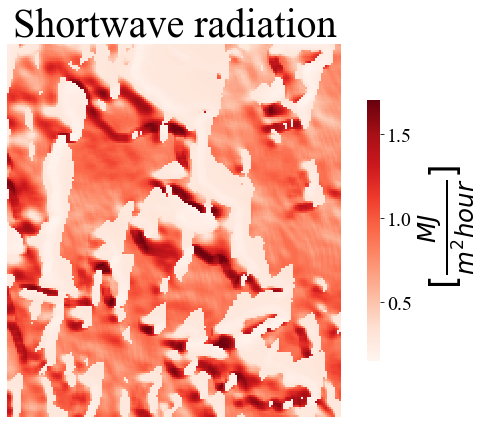

In [37]:
swr = microclima.ShortWaveRad

swr_study_area = swr[box_a1_lat:box_a3_lat, box_a3_lon:box_a2_lon]
fig,ax = make_heatmap(swr_study_area, cmap = 'Reds', vmin = np.min(swr_study_area), vmax = np.max(swr_study_area),
                      cbar_label = r' $[\frac{MJ}{m^2 hour}]$', title = 'Shortwave radiation', figsize=(8,6),
                      save_figure=True,
                      figure_filename=RESULTS_PATH+'figures/microclimate_examples_figures/mixed_arpa_ERA5_swr_{}_{}_{}_{}.png'.format(year, month, day, hour)
                     )


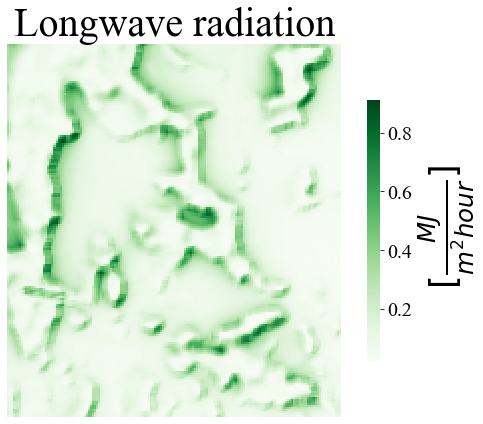

In [38]:
lwr = microclima.LongWaveRad

lwr_study_area = lwr[box_a1_lat:box_a3_lat, box_a3_lon:box_a2_lon]
fig,ax = make_heatmap(lwr_study_area, cmap = 'Greens', vmin = np.min(lwr_study_area), vmax = np.max(lwr_study_area),
                      cbar_label = r' $[\frac{MJ}{m^2 hour}]$', title = 'Longwave radiation', figsize=(8,6),
                      save_figure=True,
                      figure_filename=RESULTS_PATH+'figures/microclimate_examples_figures/mixed_arpa_ERA5_lwr_{}_{}_{}_{}.png'.format(year, month, day, hour)
                     )


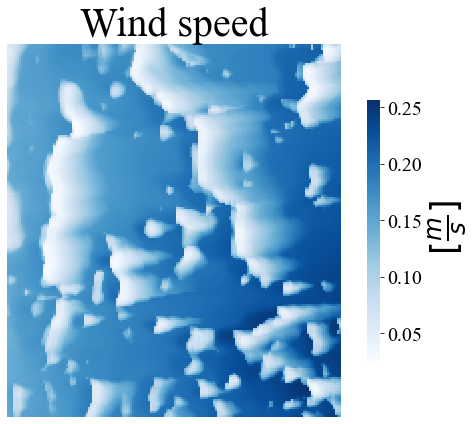

In [39]:
wind = microclima.Wind

wind_study_area = wind[box_a1_lat:box_a3_lat, box_a3_lon:box_a2_lon]
fig,ax = make_heatmap(wind_study_area, cmap = 'Blues', vmin = np.min(wind_study_area), vmax = np.max(wind_study_area),
                      cbar_label = r' $[\frac{m}{s}]$', title = 'Wind speed', figsize=(8,6),
                      save_figure=True,
                      figure_filename=RESULTS_PATH+'figures/microclimate_examples_figures/mixed_arpa_ERA5_wind_{}_{}_{}_{}.png'.format(year, month, day, hour)
                     )

# Microclimate data generation over sensors locations

This section demonstrates how the physical model is applied to calculate the corresponding physical variables at the sensor locations during specific time periods of interest.The collected data, comprising temperature and humidity measurements from the sensors and the modelled physical variables, are organized into a pd.DataFrame. This DataFrame serves as a database containing both inputs (the derived physical variables from the model) and outputs (the temperature and humidity readings from the sensors), which will be utilized in another notebook to train a feed-forward neural network. The objective will be to establish a connection between these physical variables and the measured temperature and humidity values, enabling the network to understand and predict the relationship between them.

In the present reaserch the sensors have recorded temperature and humidity in the following periods:
 - 11/11/2022-15/01/2023 (all the data referring to these period will be nicknamed as 'NovJan')
 - 1/02/2023-6/03/2023 (all the data referring to these period will be nicknamed as 'FebMar')
 - 24/03/2023-

In the section titled 'Sensors Data', the collected data from the sensors will be loaded, cleaned, and calibrated. This process ensures the data is in a suitable format for further analysis.
Following that, the 'ERA5' and 'ARPA+ERA5' sections will compute the physical model over the sensor locations for each specified time period. In the 'ERA5' section, the input data will be sourced exclusively from the ERA5 database. In contrast, the 'ARPA+ERA5' section will utilize the merged data from both the ERA5 database and the ARPA station as inputs.
By performing these computations, the physical model will generate valuable insights into the microclimate conditions at the sensor locations, providing a comprehensive understanding of the factors influencing temperature and humidity variations. These dataframes will be saved in a pickle format in the results directory (RESULTS_PATH/'output_data/results_microclimate').

## Sensors data

25 Bluetooth sensors have been deployed (initially uniformly distributed) over the area, as represented in the following figure, measuring temperature and the relative humidity. Each sensor has been covered by a wood structure to protect it from the direct contact of precipitations. 

In [11]:
sys.path.append(LIB_PATH + 'input_data_elaboration')

from data_sensors_elaboration import elaborate_data_sensors

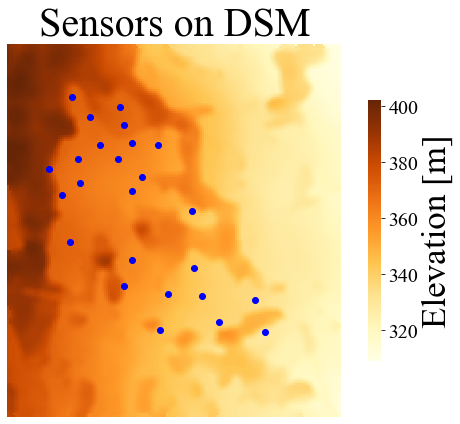

In [12]:
Boaga_Gauss_N_list = [5063710.38, 5063756.98, 5063767.35, 5063791.68, 5063834.33, 5063805.75, 5063808.15,
                      5063806.59, 5063791.70, 5063760.93, 5063781.55, 5063774.67, 5063844.81, 5063826.07,
                      5063854.62, 5063740.23, 5063658.79, 5063665.19, 5063651.88, 5063692.15, 5063621.72,
                      5063629.34, 5063656.31, 5063684.02, 5063620.18]

Boaga_Gauss_E_list = [1554206.17, 1554198.37, 1554215.40, 1554214.49, 1554225.40, 1554236.00, 1554268.43,
                      1554293.73, 1554254.72, 1554268.84, 1554186.71, 1554277.83, 1554255.11, 1554259.87,
                      1554207.48, 1554328.48, 1554303.43, 1554260.18, 1554390.65, 1554268.58, 1554296.43,
                      1554353.88, 1554338.47, 1554330.06, 1554399.33]


lats = []
longs = []

for sensor_idx in range(1,26,1):

    Gauss_Boaga_N = Boaga_Gauss_N_list[sensor_idx-1]
    Gauss_Boaga_E = Boaga_Gauss_E_list[sensor_idx-1]

    xllcorner = 1551759 
    yllcorner = 5060321 

    row_start = 688 
    col_start = 770 

    idx_lat = int(((yllcorner+3100*2) - Gauss_Boaga_N)/2)-row_start
    idx_lon = int (((Gauss_Boaga_E - xllcorner) - col_start*2)/2)
    
    lats.append(idx_lat-box_a1_lat)
    longs.append(idx_lon-box_a3_lon)


fig,ax = make_heatmap(dsm_study_case, cmap = 'YlOrBr', vmin = np.min(dsm_study_case), vmax = np.max(dsm_study_case),
                      cbar_label = 'Elevation [m]', title = 'Sensors on DSM',figsize=(8,6)
                     )
ax.scatter(longs, lats, c='blue')

fig.savefig(RESULTS_PATH+'figures/sensors_figures/sensors_locations_on_dsm.png', dpi=150) 

Prior to utilizing the sensors for temperature and humidity measurements in an open field, a calibration process was carried out under controlled conditions to mitigate potential systematic calibration errors.
First, an average temperature and humidity profile was computed using data from all the sensors. Then, for each individual sensor, the instantaneous deviation from this profile was calculated and averaged. The resulting values were established as the calibration parameters, which would subsequently be subtracted from the sensor measurements.
By applying this calibration procedure, any systematic calibration errors were addressed, ensuring more accurate and reliable temperature and humidity measurements from the sensors in the open field.
Two different calibration period have been applied:
- 09/10/2022-15/10/2022
- xx/03/2023-xx/03/2023

During both the calibration and recording periods, certain sensors experienced failures and were unable to capture measurements. These sensors have been excluded from the present research analysis, as their data is considered unreliable.
In the subsequent sections, a comprehensive list of the specific sensors that have failed will be provided, ensuring transparency and clarity regarding the data exclusion process.

### NovJan

This section focuses on loading, cleaning, and calibrating the data collected by the sensors for the time period spanning from 11th November 2022 to 15th January 2023.

In [3]:
pd.read_csv(DATA_PATH+"/data_sensors/data_calibration/data_calibration_2022_10_1__2022_10_20/Sensor_1_data_calibration_2022_10_1__2022_10_20.csv")

,time,temperature(C),humidity,note
0,2022/10/01 11:24:40,"18,38","81,3",NaN
1,2022/10/01 11:34:40,"18,31","81,6",NaN
2,2022/10/01 11:44:40,"18,25","81,6",NaN
3,2022/10/01 11:54:40,"18,19","81,3",NaN
4,2022/10/01 12:04:40,"18,19","80,9",NaN
...,...,...,...,...
2726,2022/10/20 09:44:40,"19,00","74,3",NaN
2727,2022/10/20 09:54:40,"19,06","74,4",NaN
2728,2022/10/20 10:04:40,"19,13","74,1",NaN
2729,2022/10/20 10:14:40,"19,19","74,2",NaN


,Year,Month,Day,Hour,Temperature,Humidity,Sensor_id,Gauss_Boaga_N,Gauss_Boaga_E
12,2022,11,12,0,8.848722,90.725806,1,5063710.38,1554206.17
13,2022,11,12,1,8.532055,90.789139,1,5063710.38,1554206.17
14,2022,11,12,2,8.532055,90.975806,1,5063710.38,1554206.17
15,2022,11,12,3,8.265388,90.517473,1,5063710.38,1554206.17
16,2022,11,12,4,8.232055,89.610806,1,5063710.38,1554206.17


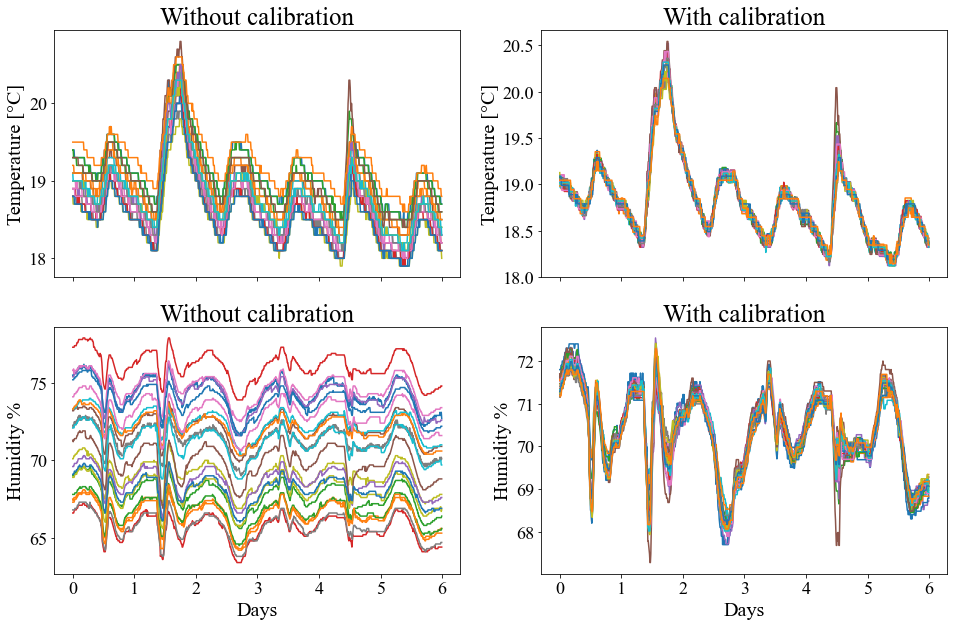

In [42]:
#the present method calibrates the sensors data plotting their calibration scenarios and returns a DataFrame with all the data

filename_calibration_sensors = DATA_PATH+"/data_sensors/data_calibration/data_calibration_2022_10_1__2022_10_20/Sensor_{}_data_calibration_2022_10_1__2022_10_20.csv"
filename_data_sensors = DATA_PATH+"/data_sensors/data_2022_11_11__2023_1_15/Sensor{}_StartDate20221111_EndDate20230116.CSV" 

sensors_calib_idx = [1,2,3,5,6,7,8,9,10,11,12,13,14,15,16,17,19,21,22,23,24,25]
sensors_idx = [1,2,3,5,6,7,8,9,10,11,12,13,14,15,16,19,21,22,23,25]

start_period_calibration = (10,9) 
end_period_calibration = (10,15)

start_period = (11,11)
end_period = (1,15)

idx_T_rem_calib = 4
idx_H_rem_calib = 4


df_sensors_NovJan = elaborate_data_sensors(filename_calibration_sensors = filename_calibration_sensors,
                                           filename_data_sensors = filename_data_sensors,
                                           sensors_calib_idx = sensors_calib_idx, sensors_idx = sensors_idx,
                                           Boaga_Gauss_N_list = Boaga_Gauss_N_list, Boaga_Gauss_E_list = Boaga_Gauss_E_list,
                                           start_period_calibration = start_period_calibration,
                                           end_period_calibration = end_period_calibration,
                                           start_period = start_period, end_period = end_period,
                                           idx_T_rem_calib = idx_T_rem_calib, idx_H_rem_calib = idx_H_rem_calib)

df_sensors_NovJan[:5]


The temperature and humidity data collected in the DataFrame can be inspected as shown below:

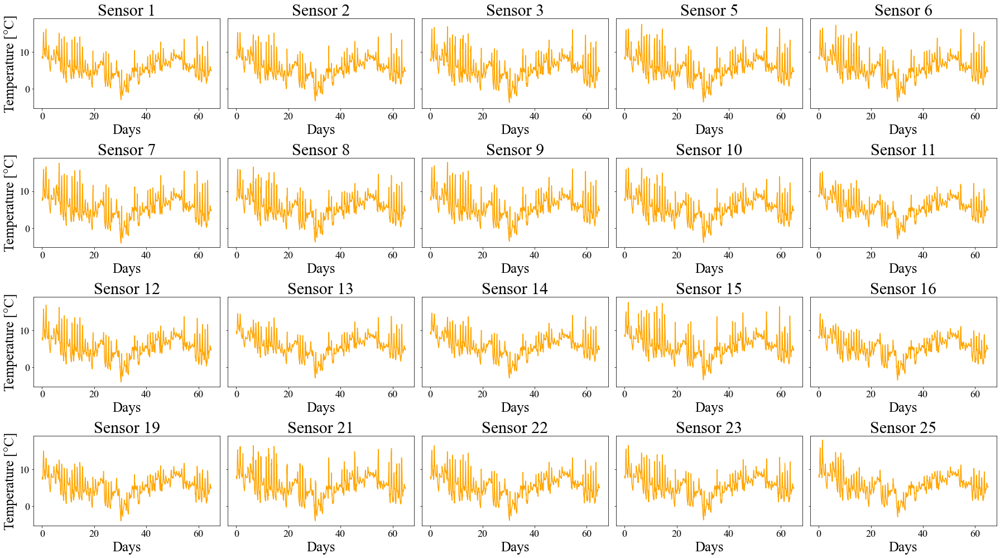

In [43]:
plot_sensors_data(df_sensors_NovJan,len_rows = 4, len_cols=5, variable = 'Temperature',
                  figsize = (25,14), color = 'orange', x_fontsize = 25,y_fontsize = 25,title_fontsize = 30)

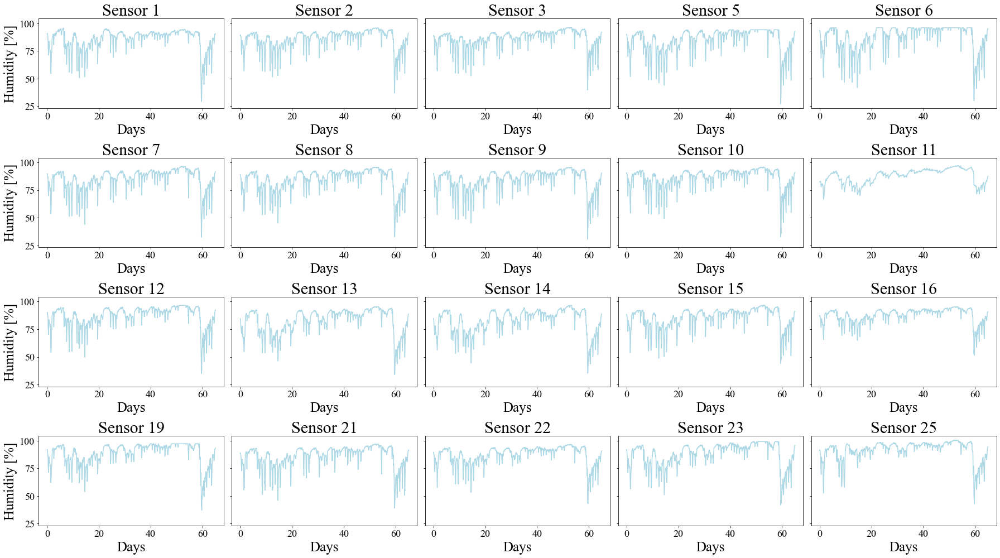

In [44]:
plot_sensors_data(df_sensors_NovJan,len_rows = 4, len_cols=5, variable = 'Humidity',
                  figsize = (25,14), color = 'lightblue', x_fontsize = 25,y_fontsize = 25,title_fontsize = 30)

### FebMar

This section focuses on loading, cleaning, and calibrating the data collected by the sensors for the time period spanning from 1th February 2023 to 6th March 2023.

,Year,Month,Day,Hour,Temperature,Humidity,Sensor_id,Gauss_Boaga_N,Gauss_Boaga_E
10,2023,2,1,0,1.948722,71.214139,1,5063710.38,1554206.17
11,2023,2,1,1,1.965388,69.632473,1,5063710.38,1554206.17
12,2023,2,1,2,1.965388,68.245806,1,5063710.38,1554206.17
13,2023,2,1,3,1.548722,68.714139,1,5063710.38,1554206.17
14,2023,2,1,4,1.982055,67.505806,1,5063710.38,1554206.17


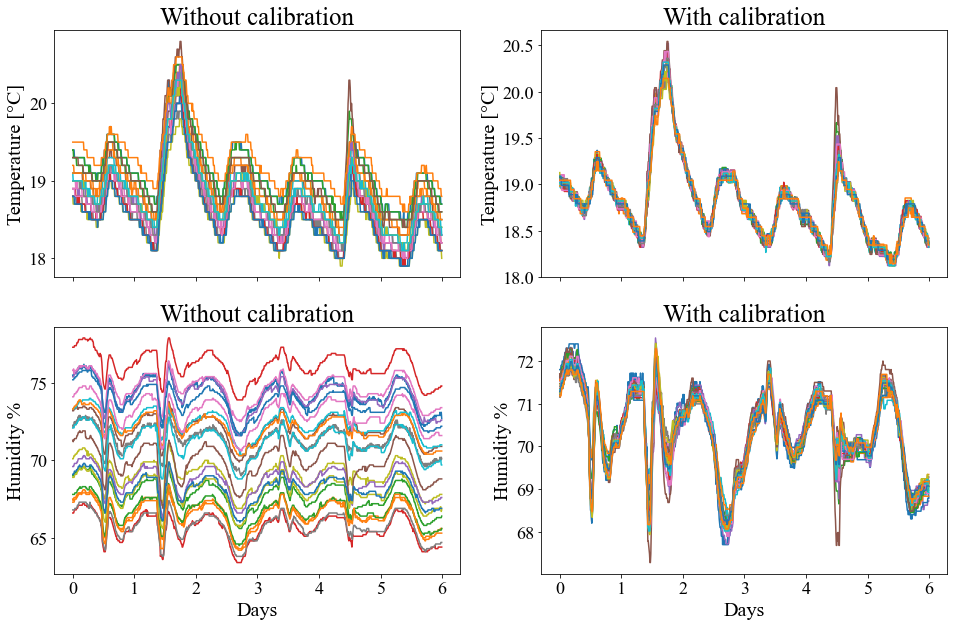

In [13]:
filename_calibration_sensors = DATA_PATH+"/data_sensors/data_calibration/data_calibration_2022_10_1__2022_10_20/Sensor_{}_data_calibration_2022_10_1__2022_10_20.csv"
filename_data_sensors = DATA_PATH+"/data_sensors/data_2023_2_1__2023_3_7/Sensor{}_StartDate20230131_EndDate20230307.CSV" 

sensors_calib_idx = [1,2,3,5,6,7,8,9,10,11,12,13,14,15,16,17,19,21,22,23,24,25]
sensors_idx = [1,5,6,7,8,10,11,13,14,15,16,19,21,22,23,25]

start_period_calibration = (10,9) 
end_period_calibration = (10,15)

start_period = (1,31) 
end_period = (3,6) 

idx_T_rem_calib = 4
idx_H_rem_calib = 4


df_sensors_FebMar = elaborate_data_sensors(filename_calibration_sensors = filename_calibration_sensors,
                                           filename_data_sensors = filename_data_sensors,
                                           sensors_calib_idx = sensors_calib_idx, sensors_idx = sensors_idx,
                                           Boaga_Gauss_N_list = Boaga_Gauss_N_list, Boaga_Gauss_E_list = Boaga_Gauss_E_list,
                                           start_period_calibration = start_period_calibration,
                                           end_period_calibration = end_period_calibration,
                                           start_period = start_period, end_period = end_period,
                                           idx_T_rem_calib = idx_T_rem_calib, idx_H_rem_calib = idx_H_rem_calib)


df_sensors_FebMar[:5]


The temperature and humidity data collected in the DataFrame can be inspected as shown below:

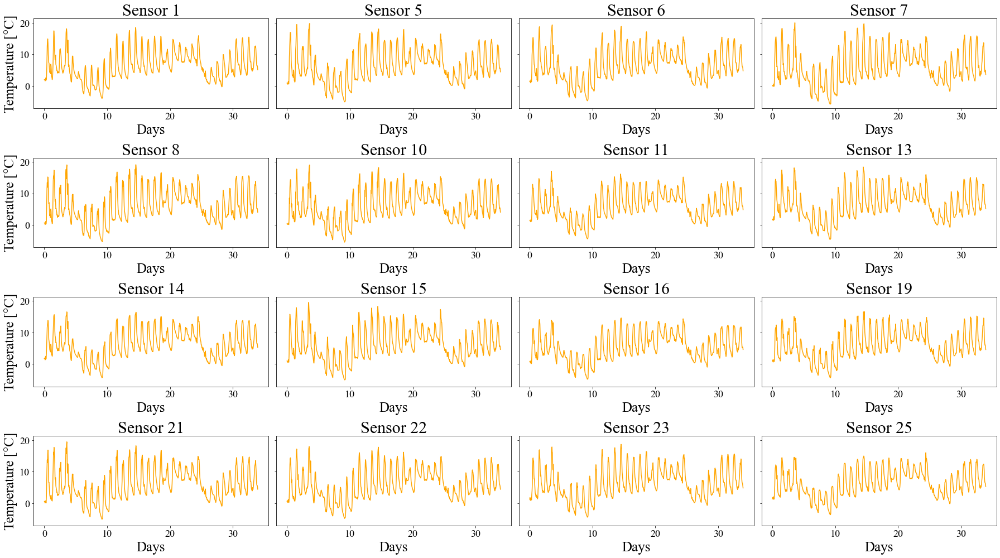

In [14]:
plot_sensors_data(df_sensors_FebMar,len_rows = 4, len_cols=4, variable = 'Temperature',
                  figsize = (25,14), color = 'orange', x_fontsize = 25,y_fontsize = 25,title_fontsize = 30)

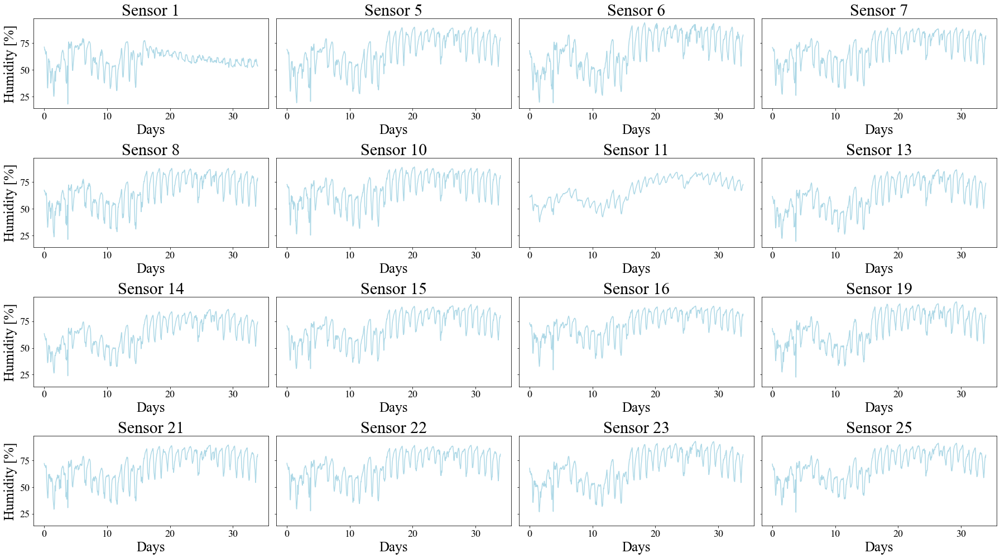

In [15]:
plot_sensors_data(df_sensors_FebMar,len_rows = 4, len_cols=4, variable = 'Humidity',
                  figsize = (25,14), color = 'lightblue', x_fontsize = 25,y_fontsize = 25,title_fontsize = 30)

### MarJun

,Year,Month,Day,Hour,Temperature,Humidity,Sensor_id,Gauss_Boaga_N,Gauss_Boaga_E
60,2023,3,27,0,4.975457,54.611481,1,5063710.38,1554206.17
61,2023,3,27,1,4.658791,54.246481,1,5063710.38,1554206.17
62,2023,3,27,2,4.042124,54.411481,1,5063710.38,1554206.17
63,2023,3,27,3,3.725457,54.536481,1,5063710.38,1554206.17
64,2023,3,27,4,3.742124,56.278148,1,5063710.38,1554206.17


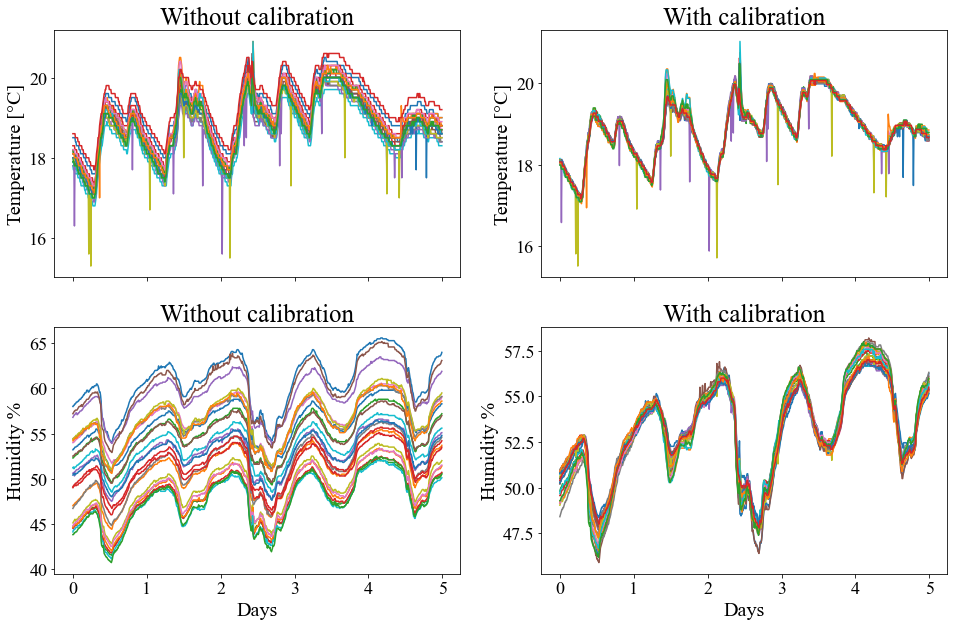

In [13]:
filename_calibration_sensors = DATA_PATH+"/data_sensors/data_calibration/data_calibration_2023_03_18__2023_03_24/Sensor{}_StartDate20230318_EndDate20230324.CSV"
filename_data_sensors = DATA_PATH+"/data_sensors/data_2023_3_24__2023_6_23/Sensor{}_StartDate20230324_EndDate20230623.CSV" 

sensors_calib_idx = [1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,23,24,25]
sensors_idx = [1,2,3,4,5,7,8,9,10,11,12,13,14,15,16,17,18,19,20,23,24,25]

start_period_calibration = (3,18) 
end_period_calibration = (3,23)

start_period = (3,26) 
end_period = (6,22) 

time_varname_calib='Date'
t_varname_calib = 'Temp'
h_varname_calib = 'Umidità'
drop_cols_calib = ['Date', 'Remark']

idx_T_rem_calib = 4
idx_H_rem_calib = 4


df_sensors_MarJun = elaborate_data_sensors(filename_calibration_sensors = filename_calibration_sensors,
                                           filename_data_sensors = filename_data_sensors,
                                           sensors_calib_idx = sensors_calib_idx, sensors_idx = sensors_idx,
                                           Boaga_Gauss_N_list = Boaga_Gauss_N_list, Boaga_Gauss_E_list = Boaga_Gauss_E_list,
                                           start_period_calibration = start_period_calibration,
                                           end_period_calibration = end_period_calibration,
                                           start_period = start_period, end_period = end_period,
                                           idx_T_rem_calib = idx_T_rem_calib, idx_H_rem_calib = idx_H_rem_calib,
                                           time_varname_calib = time_varname_calib, t_varname_calib = t_varname_calib,
                                           h_varname_calib = h_varname_calib, drop_cols_calib = drop_cols_calib
                                          
                                          )


df_sensors_MarJun[:5]


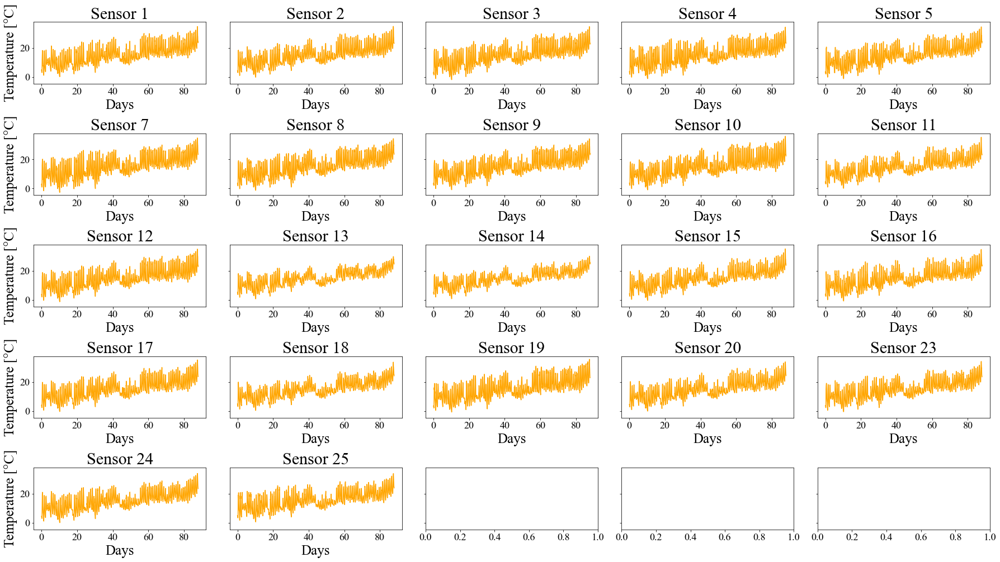

In [14]:
plot_sensors_data(df_sensors_MarJun,len_rows = 5, len_cols=5, variable = 'Temperature',
                  figsize = (25,14), color = 'orange', x_fontsize = 25,y_fontsize = 25,title_fontsize = 30)

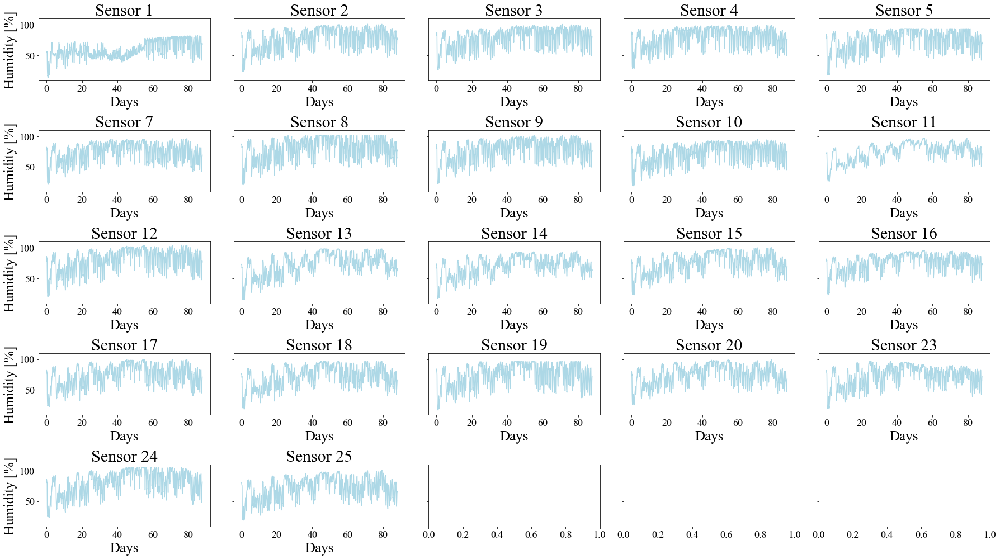

In [15]:
plot_sensors_data(df_sensors_MarJun,len_rows = 5, len_cols=5, variable = 'Humidity',
                  figsize = (25,14), color = 'lightblue', x_fontsize = 25,y_fontsize = 25,title_fontsize = 30)

## ERA5

In this section, the physical model is applied for each period of interest, expoliting the climate data from the ERA5 database. For each time instance within the selected periods, various parameters are collected, including shortwave radiation, longwave radiation, wind speed, precipitation, pressure, cloud cover, specific humidity, reference relative humidity, reference temperature, slope, aspect, and altitude of each sensor location. Additionally, the corresponding temperature and relative humidity values measured by the sensors at that specific time instance are also collected.

In [44]:
sys.path.append(LIB_PATH + 'input_data_elaboration')
from data_era5_elaboration import load_data_era5, elaborate_data_era5
sys.path.append(LIB_PATH + 'microclima_generation')
from Generate_microclimate_data_on_sensors_location import compute_microclimate_data_on_sensors_location

### NovJan

In [51]:
#load ERA5 data for the period of interest
df_era5_Nov = elaborate_data_era5(grib_filename = DATA_PATH+'/data_era5/DataERA5_2022_11.grib', 
                             year = 2022, month = 11, days_range=(12,31)) 
df_era5_Dec = elaborate_data_era5(grib_filename = DATA_PATH+'/data_era5/DataERA5_2022_12.grib', 
                             year = 2022, month = 12, days_range=(1,32)) 
df_era5_Jan = elaborate_data_era5(grib_filename = DATA_PATH+'/data_era5/DataERA5_2023_01.grib', 
                             year = 2023, month = 1, days_range=(1,16)) 

df_era5_NovJan = pd.concat([df_era5_Nov, df_era5_Dec, df_era5_Jan])
assert len(df_era5_NovJan)==len(df_sensors_NovJan)/df_sensors_NovJan.Sensor_id.nunique()


date_dict = {'Nov':[2022,11,(12,31)],
             'Dec':[2022,12,(1,32)],
             'Jan':[2023,1,(1,16)]} 


#compute the df for each time instance of the period of interest for each sensor location.
df_era5_microlimate_NovJan = compute_microclimate_data_on_sensors_location(df_Climate = df_era5_NovJan,
                                                                           df_sensors = df_sensors_NovJan,
                                                                           date_dict = date_dict,
                                                                           lat = lat, long = long,
                                                                           dsm = dsm, resolution = resolution,
                                                                           slope = slope, aspect = aspect,
                                                                           ha = ha, svf = svf,
                                                                           study_area_coordinates = study_area_coordinates
                                                                          )

df_era5_microlimate_NovJan.to_pickle(RESULTS_PATH+'/output_data/results_microclimate/results_microclimate_era5/results_microclimate_era5__2022_11_12__2023_01_15/df_microclimate_era5_NovJan_out_{}.p'.format(DATETIME))
df_era5_microlimate_NovJan

,Sensor_id,Gauss_Boaga_N,Gauss_Boaga_E,Day,Hour,Month,Year,Short-wave radiation,Long-wave radiation,Wind,...,Aspect,Altitude,Precipitation,Pressure,Cloud-cover,Specific-humidity,H_ref,T_ref,T_target,H_target
0,1,5063710.38,1554206.17,12,0,11,2022,0.0,-0.066669,0.369617,...,68.198592,370.1250,0.000000,97309.5625,0.679047,0.007074,83.998142,10.896271,8.848722,90.725806
1,2,5063756.98,1554198.37,12,0,11,2022,0.0,0.121322,0.413686,...,74.744882,368.1875,0.000000,97309.5625,0.679047,0.007074,83.998142,10.906780,8.651847,89.392311
2,3,5063767.35,1554215.40,12,0,11,2022,0.0,-0.075185,1.192428,...,108.434949,365.1250,0.000000,97309.5625,0.679047,0.007074,83.998142,10.923391,8.131245,88.811524
3,5,5063834.33,1554225.40,12,0,11,2022,0.0,0.041005,1.192428,...,212.005383,370.4375,0.000000,97309.5625,0.679047,0.007074,83.998142,10.894576,8.619323,90.032774
4,6,5063805.75,1554236.00,12,0,11,2022,0.0,-0.122016,1.192428,...,134.999998,366.3125,0.000000,97309.5625,0.679047,0.007074,83.998142,10.916950,8.633675,93.276570
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
31195,19,5063651.88,1554390.65,15,23,1,2023,0.0,-0.283665,0.039769,...,97.125016,334.8125,0.001923,95611.6875,0.235199,0.006757,91.092071,8.935942,4.883791,93.300505
31196,21,5063621.72,1554296.43,15,23,1,2023,0.0,0.038474,0.348874,...,120.963756,345.5000,0.001923,95611.6875,0.235199,0.006757,91.092071,8.877391,4.827078,91.507635
31197,22,5063629.34,1554353.88,15,23,1,2023,0.0,-0.192070,0.021679,...,90.000000,338.0000,0.001923,95611.6875,0.235199,0.006757,91.092071,8.918479,4.999763,90.858931
31198,23,5063656.31,1554338.47,15,23,1,2023,0.0,-0.387807,0.083464,...,97.125016,340.5000,0.001923,95611.6875,0.235199,0.006757,91.092071,8.904783,4.818860,95.885528


### FebMar

In [52]:
#load ERA5 data for the period of interest

df_era5_Feb= elaborate_data_era5(grib_filename = DATA_PATH+'/data_era5/DataERA5_2023_02.grib', 
                             year = 2023, month = 2, days_range=(1,29)) 
df_era5_Mar = elaborate_data_era5(grib_filename = DATA_PATH+'/data_era5/DataERA5_2023_03.grib', 
                             year = 2023, month = 3, days_range=(1,7)) 

df_era5_FebMar = pd.concat([df_era5_Feb,df_era5_Mar])
assert len(df_era5_FebMar)==len(df_sensors_FebMar)/df_sensors_FebMar.Sensor_id.nunique()

date_dict = {'Feb':[2023,2,(1,29)],
             'Mar':[2023,3,(1,7)],
            }     


#compute the df for each time instance of the period of interest for each sensor location.
df_era5_microlimate_FebMar = compute_microclimate_data_on_sensors_location(df_Climate = df_era5_FebMar, 
                                                                           df_sensors = df_sensors_FebMar,
                                                                           date_dict = date_dict,
                                                                           lat = lat, long = long,
                                                                           dsm = dsm, resolution = resolution,
                                                                           slope = slope, aspect = aspect,
                                                                           ha = ha, svf = svf,
                                                                           study_area_coordinates = study_area_coordinates
                                                                          )

df_era5_microlimate_FebMar.to_pickle(RESULTS_PATH+'/output_data/results_microclimate/results_microclimate_era5/results_microclimate_era5__2023_02_01__2023_03_06/df_microclimate_era5_FebMar_out_{}.p'.format(DATETIME))
df_era5_microlimate_FebMar


,Sensor_id,Gauss_Boaga_N,Gauss_Boaga_E,Day,Hour,Month,Year,Short-wave radiation,Long-wave radiation,Wind,...,Aspect,Altitude,Precipitation,Pressure,Cloud-cover,Specific-humidity,H_ref,T_ref,T_target,H_target
0,1,5063710.38,1554206.17,1,0,2,2023,0.0,0.086720,0.077198,...,68.198592,370.1250,4.768372e-07,97194.9375,0.929108,0.004360,74.504930,5.529749,1.948722,71.214139
1,5,5063834.33,1554225.40,1,0,2,2023,0.0,0.175033,0.106802,...,212.005383,370.4375,4.768372e-07,97194.9375,0.929108,0.004360,74.504930,5.527779,0.869323,69.072774
2,6,5063805.75,1554236.00,1,0,2,2023,0.0,0.041364,0.102518,...,134.999998,366.3125,4.768372e-07,97194.9375,0.929108,0.004360,74.504930,5.553782,1.383675,67.838237
3,7,5063808.15,1554268.43,1,0,2,2023,0.0,0.052583,0.131901,...,107.102729,362.8750,4.768372e-07,97194.9375,0.929108,0.004360,74.504930,5.575451,0.117587,70.803977
4,8,5063806.59,1554293.73,1,0,2,2023,0.0,0.105766,0.148440,...,111.250505,357.1250,4.768372e-07,97194.9375,0.929108,0.004360,74.504930,5.611698,0.652888,67.472426
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
13051,19,5063651.88,1554390.65,6,23,3,2023,0.0,-0.074233,0.065092,...,97.125016,334.8125,1.745224e-04,95608.1875,0.596069,0.006449,94.009664,7.788572,4.600458,80.592172
13052,21,5063621.72,1554296.43,6,23,3,2023,0.0,0.200727,0.072288,...,120.963756,345.5000,1.745224e-04,95608.1875,0.596069,0.006449,94.009664,7.729231,4.427078,80.489301
13053,22,5063629.34,1554353.88,6,23,3,2023,0.0,0.003947,0.052715,...,90.000000,338.0000,1.745224e-04,95608.1875,0.596069,0.006449,94.009664,7.770874,4.416430,80.803931
13054,23,5063656.31,1554338.47,6,23,3,2023,0.0,-0.163231,0.337983,...,97.125016,340.5000,1.745224e-04,95608.1875,0.596069,0.006449,94.009664,7.756993,4.818860,80.270528


### MarJun

In [79]:
#load ERA5 data for the period of interest

df_era5_Mar = elaborate_data_era5(grib_filename = DATA_PATH+'/data_era5/DataERA5_2023_03.grib', 
                             year = 2023, month = 3, days_range=(27,32))
df_era5_Apr = elaborate_data_era5(grib_filename = DATA_PATH+'/data_era5/DataERA5_2023_04.grib', 
                             year = 2023, month = 4, days_range=(1,31))
df_era5_May = elaborate_data_era5(grib_filename = DATA_PATH+'/data_era5/DataERA5_2023_05.grib', 
                             year = 2023, month = 5, days_range=(1,32))
df_era5_Jun = elaborate_data_era5(grib_filename = DATA_PATH+'/data_era5/DataERA5_2023_06.grib', 
                             year = 2023, month = 6, days_range=(1,23))

df_era5_MarJun = pd.concat([df_era5_Mar,df_era5_Apr, df_era5_May, df_era5_Jun])
assert len(df_era5_MarJun)==len(df_sensors_MarJun)/df_sensors_MarJun.Sensor_id.nunique()

date_dict = {
             'Mar':[2023,3,(27,32)],
             'Apr':[2023,4,(1,31)],
             'May':[2023,5,(1,32)],
             'Jun':[2023,6,(1,23)],
    
            }     

print('Simulation started')
#compute the df for each time instance of the period of interest for each sensor location.
df_era5_microlimate_MarJun = compute_microclimate_data_on_sensors_location(df_Climate = df_era5_MarJun, 
                                                                           df_sensors = df_sensors_MarJun,
                                                                           date_dict = date_dict,
                                                                           lat = lat, long = long,
                                                                           dsm = dsm, resolution = resolution,
                                                                           slope = slope, aspect = aspect,
                                                                           ha = ha, svf = svf,
                                                                           study_area_coordinates = study_area_coordinates
                                                                          )

df_era5_microlimate_MarJun.to_pickle(RESULTS_PATH+'/output_data/results_microclimate/results_microclimate_era5/results_microclimate_era5__2023_03_27__2023_06_22/df_microclimate_era5_MarJun_out_{}.p'.format(DATETIME))
df_era5_microlimate_MarJun

,Sensor_id,Gauss_Boaga_N,Gauss_Boaga_E,Day,Hour,Month,Year,Short-wave radiation,Long-wave radiation,Wind,...,Aspect,Altitude,Precipitation,Pressure,Cloud-cover,Specific-humidity,H_ref,T_ref,T_target,H_target
0,1,5063710.38,1554206.17,27,0,3,2023,0.0,0.104610,1.638274,...,68.198592,370.1250,0.0,96417.625,0.970001,0.003851,70.208797,4.486710,4.975457,54.611481
1,2,5063756.98,1554198.37,27,0,3,2023,0.0,0.253957,1.561915,...,74.744882,368.1875,0.0,96417.625,0.970001,0.003851,70.208797,4.499362,4.409485,87.697870
2,3,5063767.35,1554215.40,27,0,3,2023,0.0,0.097910,1.014205,...,108.434949,365.1250,0.0,96417.625,0.970001,0.003851,70.208797,4.519361,3.324902,87.100787
3,4,5063791.68,1554214.49,27,0,3,2023,0.0,0.121798,0.762428,...,129.805569,366.8125,0.0,96417.625,0.970001,0.003851,70.208797,4.508341,3.821291,88.147315
4,5,5063834.33,1554225.40,27,0,3,2023,0.0,0.190129,0.127850,...,212.005383,370.4375,0.0,96417.625,0.970001,0.003851,70.208797,4.484669,3.766291,84.123148
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
46459,19,5063651.88,1554390.65,22,23,6,2023,0.0,-0.328819,0.125850,...,97.125016,334.8125,0.0,96663.125,0.384796,0.011645,74.079402,20.677357,23.124485,72.032315
46460,20,5063692.15,1554268.58,22,23,6,2023,0.0,-0.373970,1.131749,...,82.874984,359.2500,0.0,96663.125,0.384796,0.011645,74.079402,20.564366,24.559763,67.435926
46461,23,5063656.31,1554338.47,22,23,6,2023,0.0,-0.451108,0.273709,...,97.125016,340.5000,0.0,96663.125,0.384796,0.011645,74.079402,20.651060,23.806152,71.773426
46462,24,5063684.02,1554330.06,22,23,6,2023,0.0,-0.333317,1.131749,...,99.462322,342.3750,0.0,96663.125,0.384796,0.011645,74.079402,20.642391,23.488096,81.502731


### NovMar

In [2]:
df_era5_microlimate_NovJan = pd.read_pickle(RESULTS_PATH+'/output_data/results_microclimate/results_microclimate_era5/results_microclimate_era5__2022_11_12__2023_01_15/df_microclimate_era5_NovJan_out_13-06-2023_16-59-32.p')

df_era5_microlimate_FebMar = pd.read_pickle(RESULTS_PATH+'/output_data/results_microclimate/results_microclimate_era5/results_microclimate_era5__2023_02_01__2023_03_06/df_microclimate_era5_FebMar_out_13-06-2023_16-59-32.p')

df_era5_microlimate_MarJun = pd.read_pickle(RESULTS_PATH+'/output_data/results_microclimate/results_microclimate_era5/results_microclimate_era5__2023_03_27__2023_06_22/df_microclimate_era5_MarJun_out_28-06-2023_22-26-55.p')


df_era5_microlimate_NovJun = pd.concat([df_era5_microlimate_NovJan, df_era5_microlimate_FebMar, df_era5_microlimate_MarJun])

df_era5_microlimate_NovJun.to_pickle(RESULTS_PATH+'/output_data/results_microclimate/results_microclimate_era5/results_microclimate_era5__2022_11_12__2023_06_22/df_microclimate_era5_NovJun_out_{}.p'.format(DATETIME))


## ARPA + ERA5

In this section, the physical model is applied for each period of interest, expoliting the climate data from the merged data including ERA5 data and the data measured by the ARPA station. For each time instance within the selected periods, various parameters are collected, including shortwave radiation, longwave radiation, wind speed, precipitation, pressure, cloud cover, specific humidity, reference relative humidity, reference temperature, slope, aspect, and altitude of each sensor location. Additionally, the corresponding temperature and relative humidity values measured by the sensors at that specific time instance are also collected.

In [16]:
sys.path.append(LIB_PATH + 'input_data_elaboration')
from data_arpa_elaboration import elaborate_data_mixed_arpa_era5
sys.path.append(LIB_PATH + 'microclima_generation')
from Generate_microclimate_data_on_sensors_location import compute_microclimate_data_on_sensors_location

### NovJan

In [54]:
#load mixed ARPA ERA5 data for the period of interest

df_mixed_arpa_era5_Nov = elaborate_data_mixed_arpa_era5(era5_grib_filename = DATA_PATH+'/data_era5/DataERA5_2022_11.grib', 
                                                        arpa_foldername = DATA_PATH+'data_arpa/data_arpa_goisis/data_arpa_goisis_2022_11/data_arpa_goisis_2022_11_',
                                                        dsm_study_case = dsm_study_case, arpa_station_altitude = 290,
                                                        year = 2022, month = 11, days_range=(12,31)) 

df_mixed_arpa_era5_Dec = elaborate_data_mixed_arpa_era5(era5_grib_filename = DATA_PATH+'/data_era5/DataERA5_2022_12.grib', 
                                                        arpa_foldername = DATA_PATH+'data_arpa/data_arpa_goisis/data_arpa_goisis_2022_12/data_arpa_goisis_2022_12_',
                                                        dsm_study_case = dsm_study_case, arpa_station_altitude = 290,
                                                        year = 2022, month = 12, days_range=(1,32)) 

df_mixed_arpa_era5_Jan = elaborate_data_mixed_arpa_era5(era5_grib_filename = DATA_PATH+'/data_era5/DataERA5_2023_01.grib', 
                                                        arpa_foldername = DATA_PATH+'data_arpa/data_arpa_goisis/data_arpa_goisis_2023_01/data_arpa_goisis_2023_01_',
                                                        dsm_study_case = dsm_study_case, arpa_station_altitude = 290,
                                                        year = 2023, month = 1, days_range=(1,16)) 

df_mixed_arpa_era5_NovJan = pd.concat([df_mixed_arpa_era5_Nov, df_mixed_arpa_era5_Dec, df_mixed_arpa_era5_Jan])
assert len(df_mixed_arpa_era5_NovJan)==len(df_sensors_NovJan)/df_sensors_NovJan.Sensor_id.nunique()


date_dict = {'Nov':[2022,11,(12,31)],
             'Dec':[2022,12,(1,32)],
             'Jan':[2023,1,(1,16)]} 


#compute the df for each time instance of the period of interest for each sensor location.
df_mixed_arpa_era5_microlimate_NovJan = compute_microclimate_data_on_sensors_location(df_Climate = df_mixed_arpa_era5_NovJan,
                                                                                      df_sensors = df_sensors_NovJan,
                                                                                      date_dict = date_dict,
                                                                                      lat = lat, long = long,
                                                                                      dsm = dsm, resolution = resolution,
                                                                                      slope = slope, aspect = aspect,
                                                                                      ha = ha, svf = svf,
                                                                                      study_area_coordinates = study_area_coordinates
                                                                                      )


df_mixed_arpa_era5_microlimate_NovJan.to_pickle(RESULTS_PATH+'/output_data/results_microclimate/results_microclimate_mixed_arpa_era5/results_microclimate_mixed_arpa_era5__2022_11_12__2023_01_15/df_microclimate_mixed_arpa_era5_NovJan_out_{}.p'.format(DATETIME))
df_mixed_arpa_era5_microlimate_NovJan

,Sensor_id,Gauss_Boaga_N,Gauss_Boaga_E,Day,Hour,Month,Year,Short-wave radiation,Long-wave radiation,Wind,...,Aspect,Altitude,Precipitation,Pressure,Cloud-cover,Specific-humidity,H_ref,T_ref,T_target,H_target
0,1,5063710.38,1554206.17,12,0,11,2022,0.0,-0.065346,0.056092,...,68.198592,370.1250,0.0,97309.5625,0.679047,0.007163,99.9,8.499130,8.848722,90.725806
1,2,5063756.98,1554198.37,12,0,11,2022,0.0,0.116451,0.028664,...,74.744882,368.1875,0.0,97309.5625,0.679047,0.007163,99.9,8.509523,8.651847,89.392311
2,3,5063767.35,1554215.40,12,0,11,2022,0.0,-0.073731,0.026187,...,108.434949,365.1250,0.0,97309.5625,0.679047,0.007163,99.9,8.525950,8.131245,88.811524
3,5,5063834.33,1554225.40,12,0,11,2022,0.0,0.038818,0.035936,...,212.005383,370.4375,0.0,97309.5625,0.679047,0.007163,99.9,8.497454,8.619323,90.032774
4,6,5063805.75,1554236.00,12,0,11,2022,0.0,-0.118999,0.051645,...,134.999998,366.3125,0.0,97309.5625,0.679047,0.007163,99.9,8.519580,8.633675,93.276570
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
31195,19,5063651.88,1554390.65,15,23,1,2023,0.0,-0.236986,0.300000,...,97.125016,334.8125,0.0,95611.6875,0.235199,0.005573,98.6,4.996259,4.883791,93.300505
31196,21,5063621.72,1554296.43,15,23,1,2023,0.0,0.061139,0.081260,...,120.963756,345.5000,0.0,95611.6875,0.235199,0.005573,98.6,4.934288,4.827078,91.507635
31197,22,5063629.34,1554353.88,15,23,1,2023,0.0,-0.152216,0.029716,...,90.000000,338.0000,0.0,95611.6875,0.235199,0.005573,98.6,4.977776,4.999763,90.858931
31198,23,5063656.31,1554338.47,15,23,1,2023,0.0,-0.333375,0.300000,...,97.125016,340.5000,0.0,95611.6875,0.235199,0.005573,98.6,4.963280,4.818860,95.885528


### FebMar

In [55]:
#load mixed ARPA ERA5 data for the period of interest

df_mixed_arpa_era5_Feb = elaborate_data_mixed_arpa_era5(era5_grib_filename = DATA_PATH+'/data_era5/DataERA5_2023_02.grib', 
                                                        arpa_foldername = DATA_PATH+'data_arpa/data_arpa_goisis/data_arpa_goisis_2023_02/data_arpa_goisis_2023_02_',
                                                        dsm_study_case = dsm_study_case, arpa_station_altitude = 290,
                                                        year = 2023, month = 2, days_range=(1,29)) 


df_mixed_arpa_era5_Mar = elaborate_data_mixed_arpa_era5(era5_grib_filename = DATA_PATH+'/data_era5/DataERA5_2023_03.grib', 
                                                        arpa_foldername = DATA_PATH+'data_arpa/data_arpa_goisis/data_arpa_goisis_2023_03/data_arpa_goisis_2023_03_',
                                                        dsm_study_case = dsm_study_case, arpa_station_altitude = 290,
                                                        year = 2023, month = 3, days_range=(1,7)) 


date_dict = {'Feb':[2023,2,(1,29)],
             'Mar':[2023,3,(1,7)],
            }     

df_mixed_arpa_era5_FebMar = pd.concat([df_mixed_arpa_era5_Feb, df_mixed_arpa_era5_Mar])
assert len(df_mixed_arpa_era5_FebMar)==len(df_sensors_FebMar)/df_sensors_FebMar.Sensor_id.nunique()

#compute the df for each time instance of the period of interest for each sensor location.
df_mixed_arpa_era5_microlimate_FebMar = compute_microclimate_data_on_sensors_location(df_Climate = df_mixed_arpa_era5_FebMar,
                                                                                      df_sensors = df_sensors_FebMar,
                                                                                      date_dict = date_dict,
                                                                                      lat = lat, long = long,
                                                                                      dsm = dsm, resolution = resolution,
                                                                                      slope = slope, aspect = aspect,
                                                                                      ha = ha, svf = svf,
                                                                                      study_area_coordinates = study_area_coordinates
                                                                                      )


df_mixed_arpa_era5_microlimate_FebMar.to_pickle(RESULTS_PATH+'/output_data/results_microclimate/results_microclimate_mixed_arpa_era5/results_microclimate_mixed_arpa_era5__2023_02_01__2023_03_06/df_microclimate_mixed_arpa_era5_FebMar_out_{}.p'.format(DATETIME))
df_mixed_arpa_era5_microlimate_FebMar

,Sensor_id,Gauss_Boaga_N,Gauss_Boaga_E,Day,Hour,Month,Year,Short-wave radiation,Long-wave radiation,Wind,...,Aspect,Altitude,Precipitation,Pressure,Cloud-cover,Specific-humidity,H_ref,T_ref,T_target,H_target
0,1,5063710.38,1554206.17,1,0,2,2023,0.0,0.083219,0.036181,...,68.198592,370.1250,0.0,97194.9375,0.929108,0.003803,88.4,1.179185,1.948722,71.214139
1,5,5063834.33,1554225.40,1,0,2,2023,0.0,0.166007,0.040385,...,212.005383,370.4375,0.0,97194.9375,0.929108,0.003803,88.4,1.177154,0.869323,69.072774
2,6,5063805.75,1554236.00,1,0,2,2023,0.0,0.040701,0.034880,...,134.999998,366.3125,0.0,97194.9375,0.929108,0.003803,88.4,1.203966,1.383675,67.838237
3,7,5063808.15,1554268.43,1,0,2,2023,0.0,0.051220,0.052492,...,107.102729,362.8750,0.0,97194.9375,0.929108,0.003803,88.4,1.226309,0.117587,70.803977
4,8,5063806.59,1554293.73,1,0,2,2023,0.0,0.101081,0.063219,...,111.250505,357.1250,0.0,97194.9375,0.929108,0.003803,88.4,1.263683,0.652888,67.472426
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
13051,19,5063651.88,1554390.65,6,23,3,2023,0.0,-0.055810,0.058690,...,97.125016,334.8125,0.0,95608.1875,0.596069,0.005357,87.2,6.198049,4.600458,80.592172
13052,21,5063621.72,1554296.43,6,23,3,2023,0.0,0.209528,0.028456,...,120.963756,345.5000,0.0,95608.1875,0.596069,0.005357,87.2,6.135000,4.427078,80.489301
13053,22,5063629.34,1554353.88,6,23,3,2023,0.0,0.019637,0.039892,...,90.000000,338.0000,0.0,95608.1875,0.596069,0.005357,87.2,6.179245,4.416430,80.803931
13054,23,5063656.31,1554338.47,6,23,3,2023,0.0,-0.141706,0.053418,...,97.125016,340.5000,0.0,95608.1875,0.596069,0.005357,87.2,6.164497,4.818860,80.270528


### MarJun

In [17]:
#load mixed ARPA ERA5 data for the period of interest

df_mixed_arpa_era5_Mar = elaborate_data_mixed_arpa_era5(era5_grib_filename = DATA_PATH+'/data_era5/DataERA5_2023_03.grib', 
                                                        arpa_foldername = DATA_PATH+'data_arpa/data_arpa_goisis/data_arpa_goisis_2023_03/data_arpa_goisis_2023_03_',
                                                        dsm_study_case = dsm_study_case, arpa_station_altitude = 290,
                                                        year = 2023, month = 3, days_range=(27,32)) 

df_mixed_arpa_era5_Apr = elaborate_data_mixed_arpa_era5(era5_grib_filename = DATA_PATH+'/data_era5/DataERA5_2023_04.grib', 
                                                        arpa_foldername = DATA_PATH+'data_arpa/data_arpa_goisis/data_arpa_goisis_2023_04/data_arpa_goisis_2023_04_',
                                                        dsm_study_case = dsm_study_case, arpa_station_altitude = 290,
                                                        year = 2023, month = 4, days_range=(1,31)) 

df_mixed_arpa_era5_May = elaborate_data_mixed_arpa_era5(era5_grib_filename = DATA_PATH+'/data_era5/DataERA5_2023_05.grib', 
                                                        arpa_foldername = DATA_PATH+'data_arpa/data_arpa_goisis/data_arpa_goisis_2023_05/data_arpa_goisis_2023_05_',
                                                        dsm_study_case = dsm_study_case, arpa_station_altitude = 290,
                                                        year = 2023, month = 5, days_range=(1,32)) 

df_mixed_arpa_era5_Jun = elaborate_data_mixed_arpa_era5(era5_grib_filename = DATA_PATH+'/data_era5/DataERA5_2023_06.grib', 
                                                        arpa_foldername = DATA_PATH+'data_arpa/data_arpa_goisis/data_arpa_goisis_2023_06/data_arpa_goisis_2023_06_',
                                                        dsm_study_case = dsm_study_case, arpa_station_altitude = 290,
                                                        year = 2023, month = 6, days_range=(1,23)) 





date_dict = {
             'Mar':[2023,3,(27,32)],
             'Apr':[2023,4,(1,31)],
             'May':[2023,5,(1,32)],
             'Jun':[2023,6,(1,23)],   
            }     
  

df_mixed_arpa_era5_MarJun = pd.concat([df_mixed_arpa_era5_Mar, df_mixed_arpa_era5_Apr, df_mixed_arpa_era5_May, df_mixed_arpa_era5_Jun])
assert len(df_mixed_arpa_era5_MarJun)==len(df_sensors_MarJun)/df_sensors_MarJun.Sensor_id.nunique()

print('Simulation started')
#compute the df for each time instance of the period of interest for each sensor location.
df_mixed_arpa_era5_microlimate_MarJun = compute_microclimate_data_on_sensors_location(df_Climate = df_mixed_arpa_era5_MarJun,
                                                                                      df_sensors = df_sensors_MarJun,
                                                                                      date_dict = date_dict,
                                                                                      lat = lat, long = long,
                                                                                      dsm = dsm, resolution = resolution,
                                                                                      slope = slope, aspect = aspect,
                                                                                      ha = ha, svf = svf,
                                                                                      study_area_coordinates = study_area_coordinates
                                                                                      )


df_mixed_arpa_era5_microlimate_MarJun.to_pickle(RESULTS_PATH+'/output_data/results_microclimate/results_microclimate_mixed_arpa_era5/results_microclimate_mixed_arpa_era5__2023_03_27__2023_06_22/df_microclimate_mixed_arpa_era5_MarJun_out_{}.p'.format(DATETIME))
df_mixed_arpa_era5_microlimate_MarJun


Simulation started


,Sensor_id,Gauss_Boaga_N,Gauss_Boaga_E,Day,Hour,Month,Year,Short-wave radiation,Long-wave radiation,Wind,...,Aspect,Altitude,Precipitation,Pressure,Cloud-cover,Specific-humidity,H_ref,T_ref,T_target,H_target
0,1,5063710.38,1554206.17,27,0,3,2023,0.0,0.102991,0.039753,...,68.198592,370.1250,0.0,96417.625,0.970001,0.005262,93.9,4.789463,4.975457,54.611481
1,2,5063756.98,1554198.37,27,0,3,2023,0.0,0.253265,0.018428,...,74.744882,368.1875,0.0,96417.625,0.970001,0.005262,93.9,4.800922,4.409485,87.697870
2,3,5063767.35,1554215.40,27,0,3,2023,0.0,0.096243,0.047206,...,108.434949,365.1250,0.0,96417.625,0.970001,0.005262,93.9,4.819036,3.324902,87.100787
3,4,5063791.68,1554214.49,27,0,3,2023,0.0,0.120282,0.033087,...,129.805569,366.8125,0.0,96417.625,0.970001,0.005262,93.9,4.809055,3.821291,88.147315
4,5,5063834.33,1554225.40,27,0,3,2023,0.0,0.189044,0.065457,...,212.005383,370.4375,0.0,96417.625,0.970001,0.005262,93.9,4.787615,3.766291,84.123148
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
46459,19,5063651.88,1554390.65,22,23,6,2023,0.0,-0.385369,0.756649,...,97.125016,334.8125,0.0,96663.125,0.384796,0.013823,63.4,26.071477,23.124485,72.032315
46460,20,5063692.15,1554268.58,22,23,6,2023,0.0,-0.434700,0.230021,...,82.874984,359.2500,0.0,96663.125,0.384796,0.013823,63.4,25.963889,24.559763,67.435926
46461,23,5063656.31,1554338.47,22,23,6,2023,0.0,-0.518985,0.478225,...,97.125016,340.5000,0.0,96663.125,0.384796,0.013823,63.4,26.046437,23.806152,71.773426
46462,24,5063684.02,1554330.06,22,23,6,2023,0.0,-0.390281,0.241588,...,99.462322,342.3750,0.0,96663.125,0.384796,0.013823,63.4,26.038182,23.488096,81.502731


### NovJun

In [3]:
df_mixed_arpa_era5_microlimate_NovJan = pd.read_pickle(RESULTS_PATH+'/output_data/results_microclimate/results_microclimate_mixed_arpa_era5/results_microclimate_mixed_arpa_era5__2022_11_12__2023_01_15/df_microclimate_mixed_arpa_era5_NovJan_out_13-06-2023_16-59-32.p')

df_mixed_arpa_era5_microlimate_FebMar = pd.read_pickle(RESULTS_PATH+'/output_data/results_microclimate/results_microclimate_mixed_arpa_era5/results_microclimate_mixed_arpa_era5__2023_02_01__2023_03_06/df_microclimate_mixed_arpa_era5_FebMar_out_13-06-2023_16-59-32.p')

df_mixed_arpa_era5_microlimate_MarJun = pd.read_pickle(RESULTS_PATH+'/output_data/results_microclimate/results_microclimate_mixed_arpa_era5/results_microclimate_mixed_arpa_era5__2023_03_27__2023_06_22/df_microclimate_mixed_arpa_era5_MarJun_out_29-06-2023_14-03-45.p')

df_mixed_arpa_era5_microlimate_NovJun = pd.concat([df_mixed_arpa_era5_microlimate_NovJan, df_mixed_arpa_era5_microlimate_FebMar, df_mixed_arpa_era5_microlimate_MarJun])

df_mixed_arpa_era5_microlimate_NovJun.to_pickle(RESULTS_PATH+'/output_data/results_microclimate/results_microclimate_mixed_arpa_era5/results_microclimate_mixed_arpa_era5__2022_11_12__2023_06_22/df_microclimate_mixed_arpa_era5_NovJun_out_{}'.format(DATETIME))




# Save climate dataframes

In this section, the global climate data from ERA5 and ARPA are saved as Pandas dataframes for future application. 

In [2]:
sys.path.append(LIB_PATH + 'input_data_elaboration')
from data_era5_elaboration import elaborate_data_era5
from data_arpa_elaboration import elaborate_data_mixed_arpa_era5

### ERA5

In [4]:
#NovJan climate dataframe

df_era5_Nov = elaborate_data_era5(grib_filename = DATA_PATH+'/data_era5/DataERA5_2022_11.grib', 
                             year = 2022, month = 11, days_range=(12,31)) 
df_era5_Dec = elaborate_data_era5(grib_filename = DATA_PATH+'/data_era5/DataERA5_2022_12.grib', 
                             year = 2022, month = 12, days_range=(1,32)) 
df_era5_Jan = elaborate_data_era5(grib_filename = DATA_PATH+'/data_era5/DataERA5_2023_01.grib', 
                             year = 2023, month = 1, days_range=(1,16)) 

df_era5_NovJan = pd.concat([df_era5_Nov, df_era5_Dec, df_era5_Jan])

df_era5_NovJan.to_pickle(RESULTS_PATH+'/output_data/climate_dataframes/era5/climate_dataframe_era5__2022_11_12__2023_01_15.p')

In [5]:
#FebMar climate dataframe

df_era5_Feb= elaborate_data_era5(grib_filename = DATA_PATH+'/data_era5/DataERA5_2023_02.grib', 
                             year = 2023, month = 2, days_range=(1,29)) 
df_era5_Mar = elaborate_data_era5(grib_filename = DATA_PATH+'/data_era5/DataERA5_2023_03.grib', 
                             year = 2023, month = 3, days_range=(1,7)) 

df_era5_FebMar = pd.concat([df_era5_Feb,df_era5_Mar])

df_era5_FebMar.to_pickle(RESULTS_PATH+'/output_data/climate_dataframes/era5/climate_dataframe_era5__2023_02_01__2023_03_06.p')

In [3]:
#MarJun climate dataframe

df_era5_Mar = elaborate_data_era5(grib_filename = DATA_PATH+'/data_era5/DataERA5_2023_03.grib', 
                             year = 2023, month = 3, days_range=(27,32))
df_era5_Apr = elaborate_data_era5(grib_filename = DATA_PATH+'/data_era5/DataERA5_2023_04.grib', 
                             year = 2023, month = 4, days_range=(1,31))
df_era5_May = elaborate_data_era5(grib_filename = DATA_PATH+'/data_era5/DataERA5_2023_05.grib', 
                             year = 2023, month = 5, days_range=(1,32))
df_era5_Jun = elaborate_data_era5(grib_filename = DATA_PATH+'/data_era5/DataERA5_2023_06.grib', 
                             year = 2023, month = 6, days_range=(1,23))

df_era5_MarJun = pd.concat([df_era5_Mar,df_era5_Apr, df_era5_May, df_era5_Jun])

df_era5_MarJun.to_pickle(RESULTS_PATH+'/output_data/climate_dataframes/era5/climate_dataframe_era5__2023_03_27__2023_06_22.p')


In [5]:
df_era5_NovJan = pd.read_pickle(RESULTS_PATH+'/output_data/climate_dataframes/era5/climate_dataframe_era5__2022_11_12__2023_01_15.p')
df_era5_FebMar = pd.read_pickle(RESULTS_PATH+'/output_data/climate_dataframes/era5/climate_dataframe_era5__2023_02_01__2023_03_06.p')
df_era5_MarJun = pd.read_pickle(RESULTS_PATH+'/output_data/climate_dataframes/era5/climate_dataframe_era5__2023_03_27__2023_06_22.p')

df_era5_NovJun = pd.concat([df_era5_NovJan, df_era5_FebMar, df_era5_MarJun])
df_era5_NovJun.to_pickle(RESULTS_PATH+'/output_data/climate_dataframes/era5/climate_dataframe_era5__2022_11_12__2023_06_22.p')


### Mixed ARPA ERA5

In [13]:
#NovJan climate dataframe

df_mixed_arpa_era5_Nov = elaborate_data_mixed_arpa_era5(era5_grib_filename = DATA_PATH+'/data_era5/DataERA5_2022_11.grib', 
                                                        arpa_foldername = DATA_PATH+'data_arpa/data_arpa_goisis/data_arpa_goisis_2022_11/data_arpa_goisis_2022_11_',
                                                        dsm_study_case = dsm_study_case, arpa_station_altitude = 290,
                                                        year = 2022, month = 11, days_range=(12,31)) 

df_mixed_arpa_era5_Dec = elaborate_data_mixed_arpa_era5(era5_grib_filename = DATA_PATH+'/data_era5/DataERA5_2022_12.grib', 
                                                        arpa_foldername = DATA_PATH+'data_arpa/data_arpa_goisis/data_arpa_goisis_2022_12/data_arpa_goisis_2022_12_',
                                                        dsm_study_case = dsm_study_case, arpa_station_altitude = 290,
                                                        year = 2022, month = 12, days_range=(1,32)) 

df_mixed_arpa_era5_Jan = elaborate_data_mixed_arpa_era5(era5_grib_filename = DATA_PATH+'/data_era5/DataERA5_2023_01.grib', 
                                                        arpa_foldername = DATA_PATH+'data_arpa/data_arpa_goisis/data_arpa_goisis_2023_01/data_arpa_goisis_2023_01_',
                                                        dsm_study_case = dsm_study_case, arpa_station_altitude = 290,
                                                        year = 2023, month = 1, days_range=(1,16)) 

df_mixed_arpa_era5_NovJan = pd.concat([df_mixed_arpa_era5_Nov, df_mixed_arpa_era5_Dec, df_mixed_arpa_era5_Jan])

df_mixed_arpa_era5_NovJan.to_pickle(RESULTS_PATH+'/output_data/climate_dataframes/mixed_arpa_era5/climate_dataframe_mixed_arpa_era5__2022_11_12__2023_01_15.p')


In [14]:
#FebMar climate dataframe

df_mixed_arpa_era5_Feb = elaborate_data_mixed_arpa_era5(era5_grib_filename = DATA_PATH+'/data_era5/DataERA5_2023_02.grib', 
                                                        arpa_foldername = DATA_PATH+'data_arpa/data_arpa_goisis/data_arpa_goisis_2023_02/data_arpa_goisis_2023_02_',
                                                        dsm_study_case = dsm_study_case, arpa_station_altitude = 290,
                                                        year = 2023, month = 2, days_range=(1,29)) 


df_mixed_arpa_era5_Mar = elaborate_data_mixed_arpa_era5(era5_grib_filename = DATA_PATH+'/data_era5/DataERA5_2023_03.grib', 
                                                        arpa_foldername = DATA_PATH+'data_arpa/data_arpa_goisis/data_arpa_goisis_2023_03/data_arpa_goisis_2023_03_',
                                                        dsm_study_case = dsm_study_case, arpa_station_altitude = 290,
                                                        year = 2023, month = 3, days_range=(1,7)) 

df_mixed_arpa_era5_FebMar = pd.concat([df_mixed_arpa_era5_Feb, df_mixed_arpa_era5_Mar])

df_mixed_arpa_era5_FebMar.to_pickle(RESULTS_PATH+'/output_data/climate_dataframes/mixed_arpa_era5/climate_dataframe_mixed_arpa_era5__2023_02_01__2023_03_06.p')


In [21]:
#MarJun climate dataframe
df_mixed_arpa_era5_Mar = elaborate_data_mixed_arpa_era5(era5_grib_filename = DATA_PATH+'/data_era5/DataERA5_2023_03.grib', 
                                                        arpa_foldername = DATA_PATH+'data_arpa/data_arpa_goisis/data_arpa_goisis_2023_03/data_arpa_goisis_2023_03_',
                                                        dsm_study_case = dsm_study_case, arpa_station_altitude = 290,
                                                        year = 2023, month = 3, days_range=(27,32)) 

df_mixed_arpa_era5_Apr = elaborate_data_mixed_arpa_era5(era5_grib_filename = DATA_PATH+'/data_era5/DataERA5_2023_04.grib', 
                                                        arpa_foldername = DATA_PATH+'data_arpa/data_arpa_goisis/data_arpa_goisis_2023_04/data_arpa_goisis_2023_04_',
                                                        dsm_study_case = dsm_study_case, arpa_station_altitude = 290,
                                                        year = 2023, month = 4, days_range=(1,31)) 

df_mixed_arpa_era5_May = elaborate_data_mixed_arpa_era5(era5_grib_filename = DATA_PATH+'/data_era5/DataERA5_2023_05.grib', 
                                                        arpa_foldername = DATA_PATH+'data_arpa/data_arpa_goisis/data_arpa_goisis_2023_05/data_arpa_goisis_2023_05_',
                                                        dsm_study_case = dsm_study_case, arpa_station_altitude = 290,
                                                        year = 2023, month = 5, days_range=(1,32)) 

df_mixed_arpa_era5_Jun = elaborate_data_mixed_arpa_era5(era5_grib_filename = DATA_PATH+'/data_era5/DataERA5_2023_06.grib', 
                                                        arpa_foldername = DATA_PATH+'data_arpa/data_arpa_goisis/data_arpa_goisis_2023_06/data_arpa_goisis_2023_06_',
                                                        dsm_study_case = dsm_study_case, arpa_station_altitude = 290,
                                                        year = 2023, month = 6, days_range=(1,23))  
  

df_mixed_arpa_era5_MarJun = pd.concat([df_mixed_arpa_era5_Mar, df_mixed_arpa_era5_Apr, df_mixed_arpa_era5_May, df_mixed_arpa_era5_Jun])
df_mixed_arpa_era5_MarJun.to_pickle(RESULTS_PATH+'/output_data/climate_dataframes/mixed_arpa_era5/climate_dataframe_mixed_arpa_era5__2023_03_27__2023_06_22.p')



In [6]:
df_mixed_arpa_era5_NovJan = pd.read_pickle(RESULTS_PATH+'/output_data/climate_dataframes/mixed_arpa_era5/climate_dataframe_mixed_arpa_era5__2022_11_12__2023_01_15.p')
df_mixed_arpa_era5_FebMar = pd.read_pickle(RESULTS_PATH+'/output_data/climate_dataframes/mixed_arpa_era5/climate_dataframe_mixed_arpa_era5__2023_02_01__2023_03_06.p')
df_mixed_arpa_era5_MarJun = pd.read_pickle(RESULTS_PATH+'/output_data/climate_dataframes/mixed_arpa_era5/climate_dataframe_mixed_arpa_era5__2023_03_27__2023_06_22.p')

df_mixed_arpa_era5_NovMar = pd.concat([df_mixed_arpa_era5_NovJan, df_mixed_arpa_era5_FebMar,df_mixed_arpa_era5_MarJun])
df_mixed_arpa_era5_NovMar.to_pickle(RESULTS_PATH+'/output_data/climate_dataframes/mixed_arpa_era5/climate_dataframe_mixed_arpa_era5__2022_11_12__2023_06_22.p')


# Climate data comparison between ERA5 and Mixed ARPA ERA5

In [2]:
df_era5_NovJan = pd.read_pickle(RESULTS_PATH+'/output_data/climate_dataframes/era5/climate_dataframe_era5__2022_11_12__2023_01_15.p')
df_era5_FebMar = pd.read_pickle(RESULTS_PATH+'/output_data/climate_dataframes/era5/climate_dataframe_era5__2023_02_01__2023_03_06.p')
df_era5_MarJun = pd.read_pickle(RESULTS_PATH+'/output_data/climate_dataframes/era5/climate_dataframe_era5__2023_03_27__2023_06_22.p')



df_era5 = pd.concat([df_era5_NovJan, df_era5_FebMar, df_era5_MarJun])
df_era5

,Day,Hour,Month,Year,Temperature 1m,Dew Temperature 1m,Specific humidity,Relative humidity,Pressure,Cloud cover,Wind speed 1m,Wind direction,Direct shortwave radiation,Diffuse shortwave radiation,Precipitation
0,12.0,0.0,11.0,2022.0,10.991510,8.395807,0.007074,83.998142,97309.5625,0.679047,1.192428,137.775158,0.000000,0.000000,0.0
1,12.0,1.0,11.0,2022.0,11.693170,8.320367,0.007039,79.770948,97301.1250,0.943451,1.224948,154.870869,0.000000,0.000000,0.0
2,12.0,2.0,11.0,2022.0,13.510797,8.955377,0.007349,73.914285,97302.5000,0.948700,1.015838,143.156396,0.000000,0.000000,0.0
3,12.0,3.0,11.0,2022.0,13.741754,9.470758,0.007614,75.386666,97263.2500,0.880432,1.137211,106.228545,0.000000,0.000000,0.0
4,12.0,4.0,11.0,2022.0,10.337701,8.050836,0.006916,85.705737,97227.2500,0.642212,1.307653,102.926656,0.000000,0.000000,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
523,22.0,19.0,3.0,2023.0,23.942926,16.741510,0.012348,64.102205,96743.9375,0.181305,1.411898,107.375334,0.059904,0.091904,0.0
524,22.0,20.0,3.0,2023.0,22.627008,17.037408,0.012580,70.715550,96772.9375,0.383820,1.265119,133.219169,0.000000,0.000192,0.0
525,22.0,21.0,3.0,2023.0,21.504205,16.598199,0.012227,73.640438,96804.1250,0.430359,1.060923,142.694734,0.000000,0.000000,0.0
526,22.0,22.0,3.0,2023.0,21.007135,15.712701,0.011560,71.749129,96730.5625,0.237000,1.588134,116.430368,0.000000,0.000000,0.0


In [3]:
df_mixed_arpa_era5_NovJan = pd.read_pickle(RESULTS_PATH+'/output_data/climate_dataframes/mixed_arpa_era5/climate_dataframe_mixed_arpa_era5__2022_11_12__2023_01_15.p')
df_mixed_arpa_era5_FebMar = pd.read_pickle(RESULTS_PATH+'/output_data/climate_dataframes/mixed_arpa_era5/climate_dataframe_mixed_arpa_era5__2023_02_01__2023_03_06.p')
df_mixed_arpa_era5_MarJun = pd.read_pickle(RESULTS_PATH+'/output_data/climate_dataframes/mixed_arpa_era5/climate_dataframe_mixed_arpa_era5__2023_03_27__2023_06_22.p')

df_mixed_arpa_era5 = pd.concat([df_mixed_arpa_era5_NovJan, df_mixed_arpa_era5_FebMar,df_mixed_arpa_era5_MarJun])
df_mixed_arpa_era5

,Day,Hour,Month,Year,Temperature 1m,Dew Temperature 1m,Specific humidity,Relative humidity,Pressure,Cloud cover,Wind speed 1m,Wind direction,Direct shortwave radiation,Diffuse shortwave radiation,Precipitation
0,12.0,0.0,11.0,2022.0,8.593314,8.395807,0.007163,99.9,97309.5625,0.679047,0.4,347.0,0.000000,0.000000,0.0
1,12.0,1.0,11.0,2022.0,8.193314,8.320367,0.006971,99.9,97301.1250,0.943451,0.6,300.0,0.000000,0.000000,0.0
2,12.0,2.0,11.0,2022.0,8.093314,8.955377,0.006923,99.9,97302.5000,0.948700,0.7,256.0,0.000000,0.000000,0.0
3,12.0,3.0,11.0,2022.0,7.393314,9.470758,0.006602,99.9,97263.2500,0.880432,0.4,301.0,0.000000,0.000000,0.0
4,12.0,4.0,11.0,2022.0,7.493314,8.050836,0.006650,99.9,97227.2500,0.642212,1.1,330.0,0.000000,0.000000,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
523,22.0,19.0,6.0,2023.0,29.493314,16.741510,0.013841,51.8,96743.9375,0.181305,0.8,150.0,0.059904,0.091904,0.0
524,22.0,20.0,6.0,2023.0,27.193314,17.037408,0.014119,60.4,96772.9375,0.383820,1.0,2.0,0.000000,0.000192,0.0
525,22.0,21.0,6.0,2023.0,26.793314,16.598199,0.014015,61.4,96804.1250,0.430359,2.4,48.0,0.000000,0.000000,0.0
526,22.0,22.0,6.0,2023.0,26.793314,15.712701,0.014256,62.4,96730.5625,0.237000,2.3,47.0,0.000000,0.000000,0.0


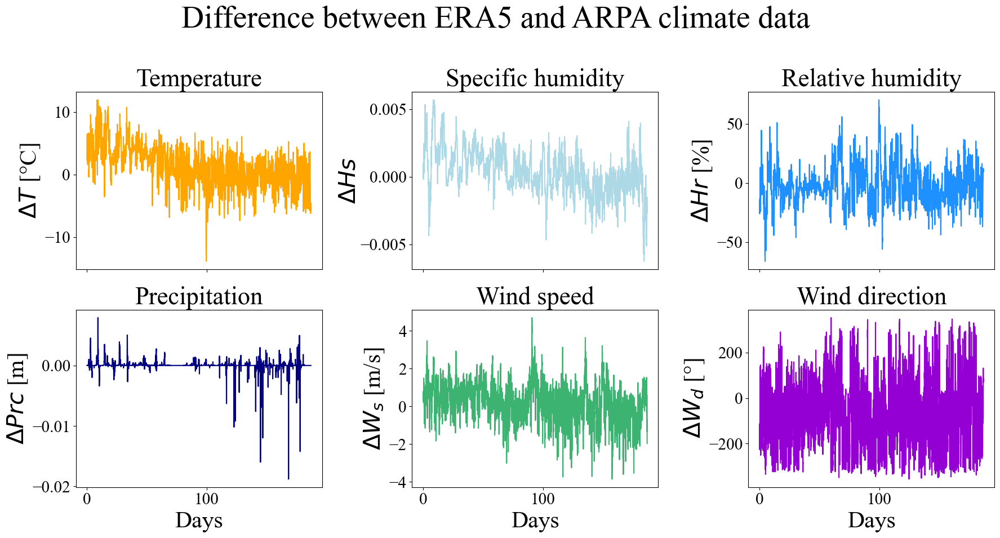

In [18]:

t = np.arange(len(df_era5))/24

fig,axs = plt.subplots(2,3, figsize = (18,10), sharex = True)
xfontsize = 30
yfontsize = 30
title_fontsize = 32
ticks_fontsize = 21

fig.suptitle('Difference between ERA5 and ARPA climate data', fontsize = 40)

ax = axs[0,0]
ax.plot(t, df_era5['Temperature 1m'].values - df_mixed_arpa_era5['Temperature 1m'].values, color = 'orange')
#ax.set_xlabel('Days',fontsize = xfontsize)
ax.set_ylabel(r'$\Delta T$'+' [°C]', fontsize = yfontsize)
ax.set_title('Temperature', fontsize = title_fontsize)
ax.tick_params(labelsize = ticks_fontsize) 

ax = axs[0,1]
ax.plot(t, df_era5['Specific humidity'].values - df_mixed_arpa_era5['Specific humidity'].values, color = 'lightblue')
#ax.set_xlabel('Days',fontsize = xfontsize)
ax.set_ylabel(r'$\Delta Hs$', fontsize = yfontsize,labelpad=0.1)
ax.set_title('Specific humidity', fontsize = title_fontsize)
ax.tick_params(labelsize = ticks_fontsize) 

ax = axs[0,2]
ax.plot(t, df_era5['Relative humidity'].values - df_mixed_arpa_era5['Relative humidity'].values, color = 'dodgerblue')
#ax.set_xlabel('Days',fontsize = xfontsize)
ax.set_ylabel(r'$\Delta Hr$' +' [%]', fontsize = yfontsize)
ax.set_title('Relative humidity', fontsize = title_fontsize)
ax.tick_params(labelsize = ticks_fontsize) 

ax = axs[1,0]
ax.plot(t, df_era5['Precipitation'].values - df_mixed_arpa_era5['Precipitation'].values, color = 'navy')
ax.set_xlabel('Days',fontsize = xfontsize)
ax.set_ylabel(r'$\Delta Prc$'+' [m]', fontsize = yfontsize)
ax.set_title('Precipitation', fontsize = title_fontsize)
ax.tick_params(labelsize = ticks_fontsize) 

ax = axs[1,1]
ax.plot(t, df_era5['Wind speed 1m'].values - df_mixed_arpa_era5['Wind speed 1m'].values, color = 'mediumseagreen')
ax.set_xlabel('Days',fontsize = xfontsize)
ax.set_ylabel(r'$\Delta W_s$'+' [m/s]', fontsize = yfontsize)
ax.set_title('Wind speed', fontsize = title_fontsize)
ax.tick_params(labelsize = ticks_fontsize) 

ax = axs[1,2]
ax.plot(t, df_era5['Wind direction'].values - df_mixed_arpa_era5['Wind direction'].values, color = 'darkviolet')
ax.set_xlabel('Days',fontsize = xfontsize)
ax.set_ylabel(r'$\Delta W_d$'+' [°]', fontsize = yfontsize)
ax.set_title('Wind direction', fontsize = title_fontsize)
ax.tick_params(labelsize = ticks_fontsize) 

fig.tight_layout(rect=[0, 0.03, 1, 0.95])
fig.savefig(RESULTS_PATH+'figures/microclimate_examples_figures/ARPA_vs_ERA5_climate_data.png', dpi=150)

# References

I. M. Maclean, J. R. Mosedale, J. J. Bennie, Microclima: An r package
for modelling meso-and microclimate, Methods in Ecology and Evolution
10 (2) (2019) 280–290.

J. Monteith, M. Unsworth, Principles of environmental physics: plants,
animals, and the atmosphere, Academic Press, 2013.

H. Hersbach, B. Bell, P. Berrisford, G. Biavati, A. Hor ́anyi,
J. Mu ̃noz Sabater, J. Nicolas, C. Peubey, R. Radu, I. Rozum, et al.,
Era5 hourly data on single levels from 1979 to present, Copernicus Cli-
mate Change Service (C3S) Climate Data Store (CDS) 10 (2018).

D. Bolton, The computation of equivalent potential temperature, Monthly
weather review 108 (7) (1980) 1046–1053.

T. Hengl, H. I. Reuter, Geomorphometry: concepts, software, applications,
Newnes, 2008.

B. K. Horn, Hill shading and the reflectance map, Proceedings of the IEEE
69 (1) (1981) 14–47.

J. E. Hay, D. C. McKAY, Estimating solar irradiance on inclined surfaces:
a review and assessment of methodologies, International Journal of Solar
Energy 3 (4-5) (1985) 203–240.

T. Konzelmann, R. S. van de Wal, W. Greuell, R. Bintanja, E. A. Henneken,
A. Abe-Ouchi, Parameterization of global and longwave incoming radiation
for the greenland ice sheet, Global and Planetary change 9 (1-2) (1994)
143–164.

W. Brutsaert, On a derivable formula for long-wave radiation from clear
skies, Water resources research 11 (5) (1975) 742–744.

B. C. Ryan, A mathematical model for diagnosis and prediction of sur-
face winds in mountainous terrain, Journal of Applied Meteorology and
Climatology 16 (6) (1977) 571–584.